# Set up

Define work location :

In [1]:
# Define work location
work_loc = 'local'  # colab (google) or local (pc)

Mount Google Drive :

In [2]:
project_path = "My Drive/OPENCLASSROOMS/Projets DATA/6. Classification biens consommation"

if (work_loc == 'colab'):
    # Mount Drive folder
    from google.colab import drive
    drive.mount('/content/drive')

    # Google Drive path
    work_path = "/content/drive/"

elif (work_loc == 'local'):
    # Local drive path
    work_path = "/Users/victor/Library/CloudStorage/GoogleDrive-vicozer@gmail.com/"

else:
    raise ValueError("Choose between 'colab' or 'local' work!")

Python librairies install :

In [3]:
if work_loc == 'colab':
  %pip install fasttext
  %pip install transformers
  %pip install tensorflow

Python librairies imports :

In [4]:
import os
import time
import copy
import numpy as np
import pandas as pd
import re
import csv

import matplotlib.pyplot as plt
import seaborn as sns

from wordcloud import WordCloud
from collections import Counter

import spacy
from spacy.lang.en.stop_words import STOP_WORDS

from string import punctuation

import fasttext

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score, f1_score, accuracy_score, recall_score, confusion_matrix
from sklearn.model_selection import train_test_split

import torch
from torchvision import datasets, transforms
from torchvision.models import resnet50
import torch.nn.functional as F
from torch.utils.data import DataLoader
from transformers import BertForSequenceClassification, BertTokenizerFast

import tensorflow as tf
import tensorflow_hub as hub

import cv2
import glob
from pathlib import Path
import shutil
from PIL import Image

import missingno as msno

import warnings

# Remove warning
warnings.simplefilter(action='ignore', category=FutureWarning)
os.environ["TOKENIZERS_PARALLELISM"] = "false"

%matplotlib inline
sns.set_theme(palette="Set2")

Load pycodestyle (PEP8) :

In [5]:
if (work_loc == 'local'):
    # Pycodestyle (PEP8)
    %load_ext pycodestyle_magic
    %pycodestyle_on --max_line_length 125  # GitHub limit

Load data :

In [6]:
# Load data
data = pd.read_csv(work_path + project_path + "/Flipkart/flipkart_com-ecommerce_sample_1050.csv")

Load spaCy parser: 

In [7]:
# Load english tokenizer, tagger, parser and NER
nlp = spacy.load("en_core_web_sm")

# Functions

## Plot functions

In [8]:
# Display barplot
def display_barplot(data=None, x=None, y=None, title='Barplot', figsize=(12, 8),
                    order=None, palette=None, xrotation=0):
    plt.figure(figsize=figsize)
    plt.title(title)
    sns.barplot(data=data, x=x, y=y, order=order, palette=palette)
    plt.xticks(rotation=xrotation)
    plt.show()


# Display histplot
def display_histplot(data, x=None, y=None, title='Histplot', figsize=(12, 8), kde=False):
    plt.figure(figsize=figsize)
    plt.title(title)
    sns.histplot(data=data, x=x, y=y, kde=kde)
    plt.show()


# Display countplot
def display_countplot(data, x=None, y=None, title='Countplot', figsize=(12, 8),
                      order=None, xrotation=0):
    plt.figure(figsize=figsize)
    plt.title(title)
    sns.countplot(data=data, x=x, y=y, order=order)
    plt.xticks(rotation=xrotation)
    plt.show()


# Display scatterplot
def display_scatterplot(data, x=None, y=None, title='Scatterplot', figsize=(8, 8), hue=None, palette=None):
    plt.figure(figsize=figsize)
    plt.title(title)
    sns.scatterplot(data=data, x=x, y=y, hue=hue, palette=palette)
    if(hue is not None):
        plt.legend(bbox_to_anchor=(1.0, 1), loc=2, borderaxespad=0.)
    plt.show()


# Display scatterplot
def display_scatterplot_annotate(data, x=None, y=None, title='Scatterplot', figsize=(8, 8), annotation='name'):
    plt.figure(figsize=figsize)
    plt.title(title)
    for i in range(data.shape[0]):
        pt_x = data[x].iloc[i]
        pt_y = data[y].iloc[i]
        pt_name = data[annotation].iloc[i]
        sns.scatterplot(x=[pt_x], y=[pt_y])
        plt.annotate(pt_name, xy=(pt_x, pt_y), xytext=(5, 2), textcoords='offset points',
                     ha='right', va='bottom')
    plt.tight_layout()
    plt.show()

34:7: E275 missing whitespace after keyword


In [9]:
# Display multi plot
def create_multi_plot(n_elements, title="Plot", figsize=None):

    # Compute size of plot
    if(n_elements < 4):
        n_rows = 1
        n_cols = n_elements
    elif(n_elements == 4):
        n_rows = 2
        n_cols = 2
    else:
        n_rows = (n_elements // 3 + 1) if (n_elements % 3 > 0) else (n_elements // 3)
        n_cols = 3

    # Init fig
    fig, ax = plt.subplots(n_rows, n_cols, figsize=figsize)

    # Flatten the list of axes
    axes = ax.flatten() if isinstance(ax, np.ndarray) else np.array(ax)

    # Title
    plt.suptitle(title)

    return fig, axes

5:7: E275 missing whitespace after keyword
8:9: E275 missing whitespace after keyword


In [10]:
# Display multi countplot
def display_multi_countplot(data, columns, title='Countplot', figsize=(20, 20),
                            order=None, xrotation=None):

    elem_n = len(columns)

    # Create subplots
    fig, axes = create_multi_plot(elem_n, title=title, figsize=figsize)

    for ax, elem in zip(axes, range(elem_n)):

        # Draw counplot
        sns.countplot(data=data, x=columns[elem], order=order, ax=ax)
        ax.title.set_text(columns[elem])

        if data[columns[elem]].dtypes == object:
            ax.tick_params(axis='x', labelrotation=xrotation)

    plt.tight_layout()
    plt.show()

In [11]:
# Display multi hue scatterplot
def display_multihue_scatterplot(data, x, y, hue_list, title, figsize=(20, 20)):

    elem_n = len(hue_list)

    # Create subplots
    fig, axes = create_multi_plot(elem_n, title=title, figsize=figsize)

    for ax, elem in zip(axes, range(elem_n)):
        hue = hue_list[elem]
        # Draw scatterplot
        sns.scatterplot(data=data, x=x, y=y, hue=hue, ax=ax,
                        palette=sns.color_palette("husl", data[hue].nunique()))
        ax.legend(bbox_to_anchor=(1.0, 1), loc=2, borderaxespad=0.)
        ax.title.set_text(hue)

    plt.tight_layout()
    plt.show()

In [12]:
# Display BoW of selected index
def display_bow_by_index(bow_data, index):
    bow = bow_data.iloc[index, :][bow_data.iloc[index, :] > 0]
    display_barplot(x=bow.index, y=bow.values, xrotation=90, figsize=(20, 10),
                    title="BoW of index {} (tokens={})".format(index, len(bow.index)))

## Apply functions

In [13]:
# Apply function product category from dictionary
def apply_new_category(row, **dictionary):
    category_1 = row['product_category_1']
    category_2 = row['product_category_2']
    new_category = category_1 + " Others"

    if (type(category_2) != int) and (type(category_2) != float):
        for dict_category, dict_category_list in dictionary.items():
            if category_2 in dict_category_list:
                new_category = dict_category
                break

    return new_category

## Text functions

In [14]:
# Clean a text with spaCy
def spacy_tokenizer(text):
    # Create the token object
    tokens = nlp(text)

    # Remove empty tokens
    tokens = [token for token in tokens if token.text.strip() != ""]

    # Remove unwanted tokens
    tokens = [token for token in tokens if not (token.is_punct or token.is_space or token.is_quote or token.is_bracket)]

    # Remove numbers
    tokens = [token for token in tokens if not (token.like_num or token.is_currency)]

    # Remove auxilary verbs
    tokens = [token for token in tokens if token.pos_ != "AUX"]

    # Remove 1-2 letters nouns
    tokens = [token for token in tokens if len(token.text) > 2 or token.pos_ not in ["PROPN", "NOUN"]]

    # Remove adpositions
    # tokens = [token for token in tokens if token.pos_ != "ADP"]

    # Lemmatize each token and convert each token into lowercase
    tokens = [token.lemma_.lower().strip() if token.lemma_ != "-PRON-" else token.lower_ for token in tokens]

    # Remove stop words
    tokens = [token for token in tokens if token not in STOP_WORDS]

    # Remove punctuation within tokens
    tokens = [token.translate(str.maketrans('', '', punctuation)) for token in tokens]

    # Remove tokens that contains numbers
    tokens = [token for token in tokens if not re.search(r'\d', token)]

    # Return preprocessed list of tokens
    return tokens

In [15]:
# Display wordcloud
def display_wordcloud(text, stopwords=None, max_words=50, background_color='white'):
    wordcloud = WordCloud(background_color=background_color,
                          stopwords=stopwords,
                          collocations=False,
                          max_words=max_words).generate(text)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

## Image functions

In [16]:
# Load all images in grayscale
def load_all_images_from_path(images_names, folder_path):
    images_list = []

    for image_name in images_names:
        image_path = folder_path + image_name

        # Load image in gray scale
        image_cv = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        images_list.append(image_cv)

    return images_list

In [17]:
# Display image histograms
def display_image_histograms(product_name, cv_img, color="tab:red"):
    # Define figure
    figure = plt.figure(figsize=(20, 5))
    plt.title(product_name + " " + str(cv_img.shape), fontweight="bold", pad=50)
    plt.axis('off')

    # Add histogram
    figure.add_subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(cv_img, cmap='gray')

    # Add histogram
    figure.add_subplot(1, 3, 2)
    plt.title("Histogram")
    sns.histplot(cv_img.flatten(), bins=256, color=color)
    plt.xlabel('Gray level')
    plt.ylabel('Pixels')

    # Add normalized and cumulative histogram
    figure.add_subplot(1, 3, 3)
    plt.title("Cumulative and normalized histogram")
    sns.histplot(cv_img.flatten(), bins=256, stat='density', cumulative=True, color=color)
    plt.xlabel('Gray level')
    plt.ylabel('Pixels')

    plt.show()

In [18]:
# Get visual words from image
def visual_words_from_image(model, descriptors):
    n_descriptors = len(descriptors)

    # Initialize list of visual words
    visual_words = np.zeros(len(model.cluster_centers_))

    # Predict visual words
    visual_words_predict = model.predict(descriptors)

    # Fill visual words
    for vw in visual_words_predict:
        visual_words[vw] += 1.0 / n_descriptors

    return visual_words

In [19]:
# Train CNN model
def cnn_train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['TRAIN', 'TEST']:
            if phase == 'TRAIN':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(torch_device)
                labels = labels.to(torch_device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'TRAIN'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'TRAIN':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'TRAIN':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # deep copy the model
            if phase == 'TEST' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [20]:
# Display an image
def display_image_cv(image_cv, title="Image", figsize=(3, 3)):    
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.title(title)
    plt.imshow((image_cv * 255).astype(np.uint8))
    plt.tight_layout()
    plt.show()

2:63: W291 trailing whitespace


In [21]:
def cnn_display_predictions(model, num_images=6, figsize=(3, 3)):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['TEST']):
            inputs = inputs.to(torch_device)
            labels = labels.to(torch_device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                plt.figure(figsize=figsize)
                plt.axis('off')
                plt.title('predicted: {} truth: {}'.format(class_names[preds[j]], class_names[labels[j]]))
                img = inputs.cpu().data[j].numpy().transpose((1, 2, 0))
                img = STD * img + MEAN
                plt.imshow((img * 255).astype(np.uint8))
                plt.tight_layout()
                plt.show()

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [22]:
# Copy image in new folder (directory)
def copy_images_in_new_folder(images_names, images_labels, folder_path, new_folder):

    # Create folder if not existing
    if not Path(folder_path + new_folder).exists():
        os.makedirs(folder_path + new_folder)

    for image_name, image_label in zip(images_names, images_labels):
        image_path = folder_path + image_name

        # Create label folder if not existing
        label_path = os.path.join(folder_path, new_folder, image_label)

        if not Path(label_path).exists():
            os.makedirs(label_path)

        # Copy image
        image_destination = os.path.join(label_path, image_name)
        shutil.copy(image_path, image_destination)

## Dimension reduction functions

In [23]:
# Apply TSNE and create dataframe
def TSNE_create(data, n_components=2, perplexity=50, init='pca', learning_rate='auto'):

    # Create TSNE model
    tsne = TSNE(n_components=n_components, perplexity=perplexity, init=init, learning_rate=learning_rate,
                random_state=0)

    # Apply on data
    tsne_data = tsne.fit_transform(data)

    # Create dataframe
    columns = ["tSNE"+str(i) for i in range(1, n_components+1)]
    tsne_df = pd.DataFrame(data=tsne_data, columns=columns)

    return tsne_df

In [24]:
# Try TSNE perplexity values
def TSNE_try_perplexity(data, perplexities=[5, 10, 20, 30, 40, 50], figsize=(30, 20)):

    # Define number of columns
    elem_n = len(perplexities)

    # Create subplots
    fig, axes = create_multi_plot(elem_n, title="t-SNE: test perplexity values", figsize=figsize)

    for ax, elem in zip(axes, range(elem_n)):

        # Create TSNE df
        tsne_df = TSNE_create(data, perplexity=perplexities[elem])

        # Draw scatterplot
        sns.scatterplot(data=tsne_df, x='tSNE1', y='tSNE2', ax=ax)

    plt.tight_layout()
    plt.show()

## Clustering functions

In [25]:
# Apply KMeans and return labels
def KMeans_labels(data, n_clusters):

    # Create KMeans model
    km = KMeans(n_clusters=n_clusters, random_state=0)

    # Predict clusters
    km_labels = km.fit_predict(data)

    return km_labels

# Data analysis

## General information

I display the general information on the dataset.

In [26]:
# Display info
display(data.info())

# Display first rows
print("\nFirst rows: ")
display(data.head(5))

# Display description
print("\nNumerical columns description: ")
display(data.describe(include=[np.number]))
print("\nCategorical columns description: ")
display(data.describe(exclude=[np.number]))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

None


First rows: 


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."



Numerical columns description: 


,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000



Categorical columns description: 


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,1050,2,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,1,993,1,889,889,11,22


## Missing values

Let's check the dataset missing values.

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

There are 2.17% missing values.


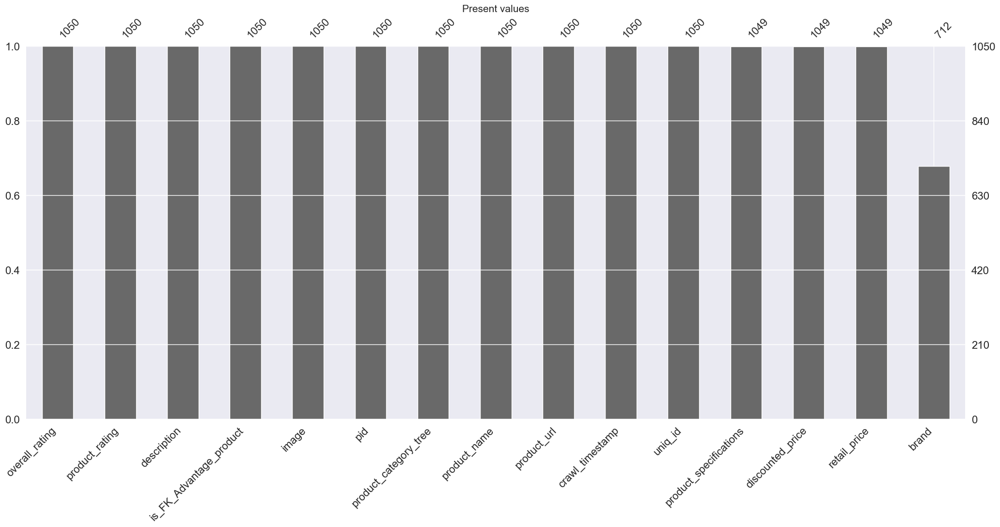

In [27]:
# Display missing values number
display(data.isnull().sum())
print("There are {0:.2%} missing values.".format(data.isna().sum().sum()/data.size))

# Display missing values bars
barchart = msno.bar(data, sort="descending")
barchart.set_title("Present values", fontsize=15)
plt.show()

## Duplicates

Let's check if there are duplicates in the dataset.

In [28]:
# Check for duplicates
duplicates = data.duplicated()
print(str(data[duplicates].size) + " duplicates found in the dataset.")

0 duplicates found in the dataset.


# Data exploration

In [29]:
# Copy raw data before exploration
df = data.copy()

## Product category

Let's analyse the products categories.

First I split the variable *product_category_tree* to check how many sub categories there are.

In [30]:
# Define separator to split product category tree string
sep = " >> "

In [31]:
# Create categories number serie
product_category_number = df['product_category_tree'].apply(lambda x: len(x.split(sep)))

display(product_category_number.value_counts())

3    368
5    278
4    274
6     70
7     57
2      3
Name: product_category_tree, dtype: int64

Most products have 3+ categories. I decide to create three new variables for each category and sub category.

In [32]:
# Create three main category variables
df['product_category_1'] = df['product_category_tree'].apply(lambda x: x.split(sep)[0][2:])
df['product_category_2'] = df['product_category_tree'].apply(lambda x: x.split(sep)[1])
df['product_category_3'] = df['product_category_tree'].apply(lambda x: x.split(sep)[2] if(len(x.split(sep)) > 2) else 'None')

display(df[['product_category_1', 'product_category_2', 'product_category_3']])
display(df[['product_category_1', 'product_category_2', 'product_category_3']].describe())

,product_category_1,product_category_2,product_category_3
0,Home Furnishing,Curtains & Accessories,Curtains
1,Baby Care,Baby Bath & Skin,Baby Bath Towels
2,Baby Care,Baby Bath & Skin,Baby Bath Towels
3,Home Furnishing,Bed Linen,Bedsheets
4,Home Furnishing,Bed Linen,Bedsheets
...,...,...,...
1045,Baby Care,Baby & Kids Gifts,Stickers
1046,Baby Care,Baby & Kids Gifts,Stickers
1047,Baby Care,Baby & Kids Gifts,Stickers
1048,Baby Care,Baby & Kids Gifts,Stickers


,product_category_1,product_category_2,product_category_3
count,1050,1050,1050
unique,7,63,247
top,Home Furnishing,Wrist Watches,Deodorants
freq,150,149,65


4:90: E275 missing whitespace after keyword


I display the first category.

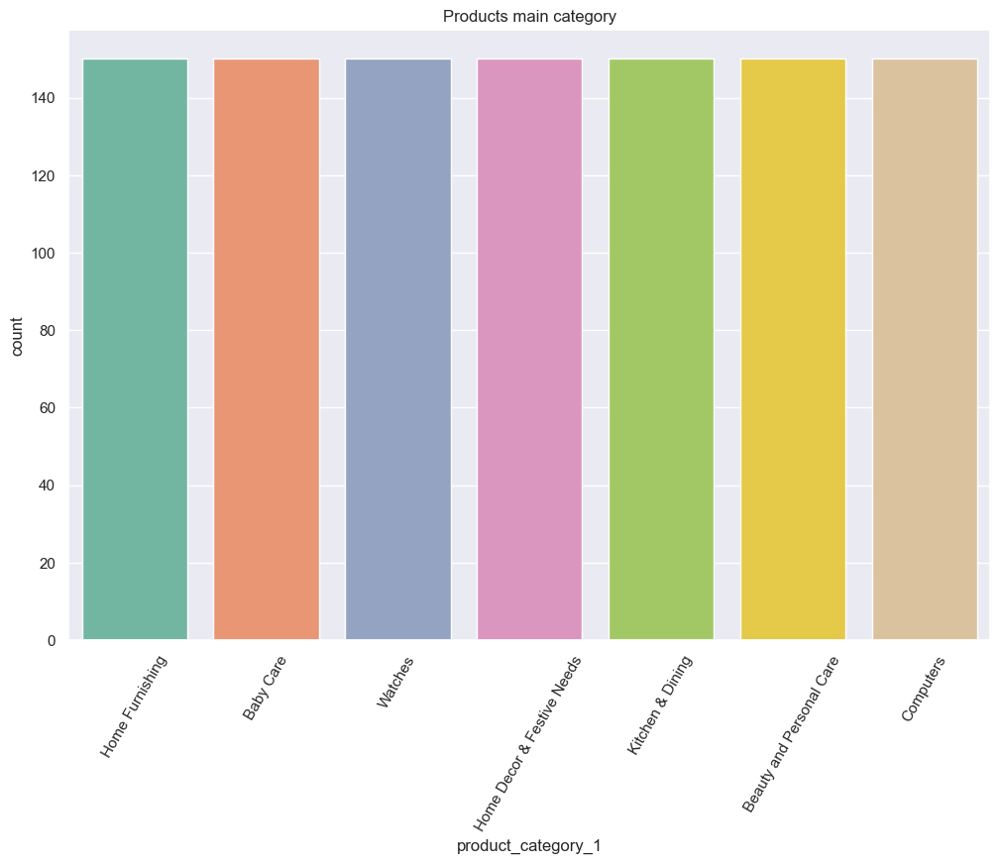

In [33]:
# Display first catergory
display_countplot(data=df, x='product_category_1', title="Products main category", xrotation=60)

I display the product categories within each first main product categories.

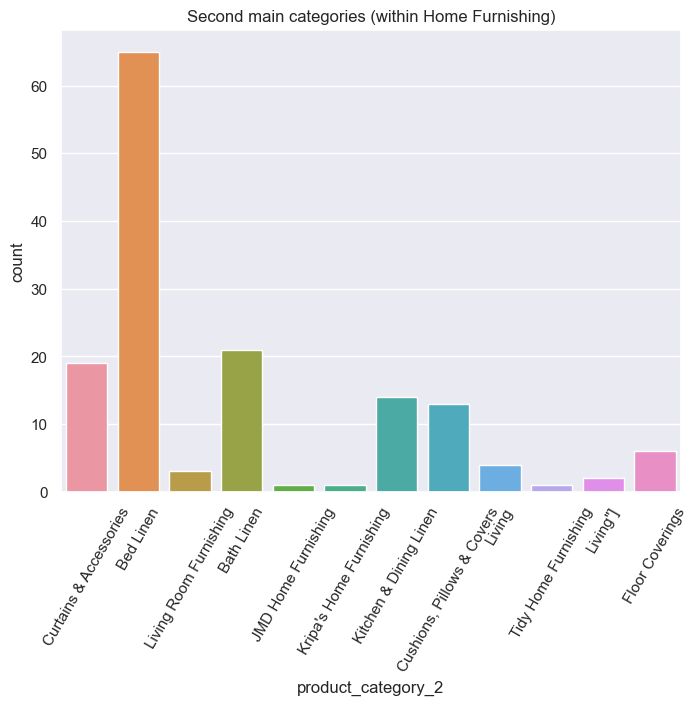

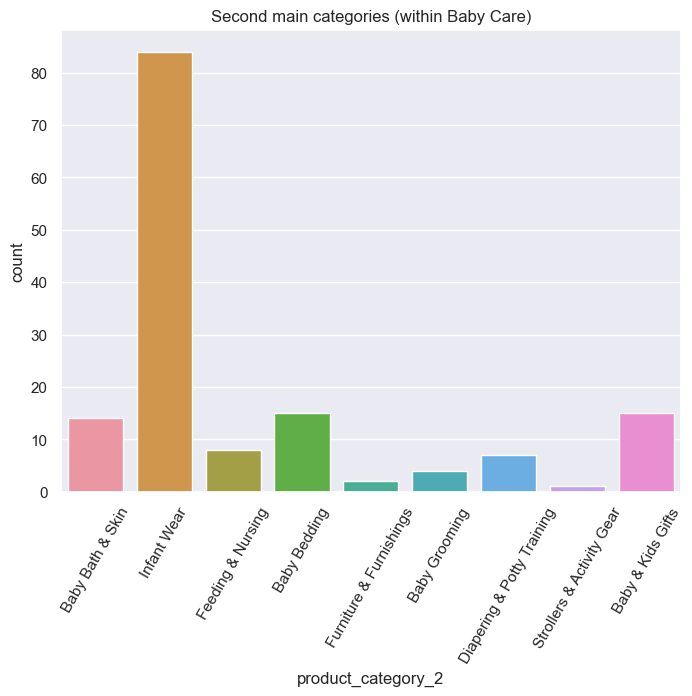

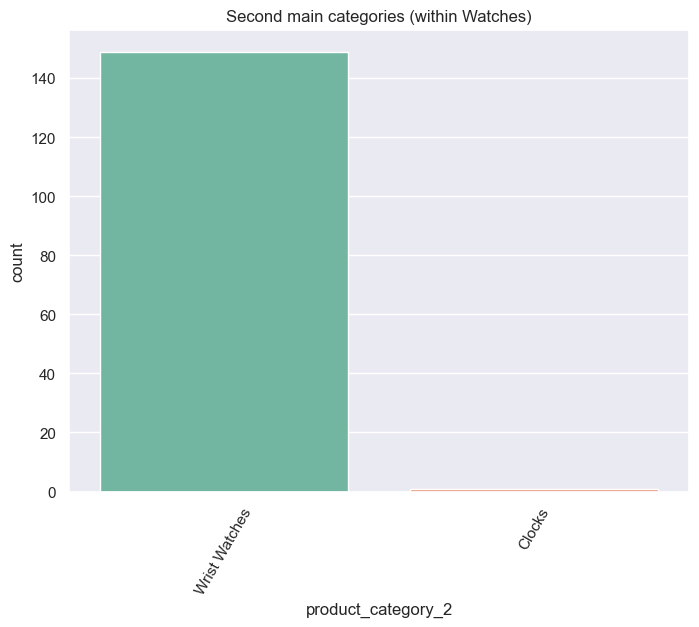

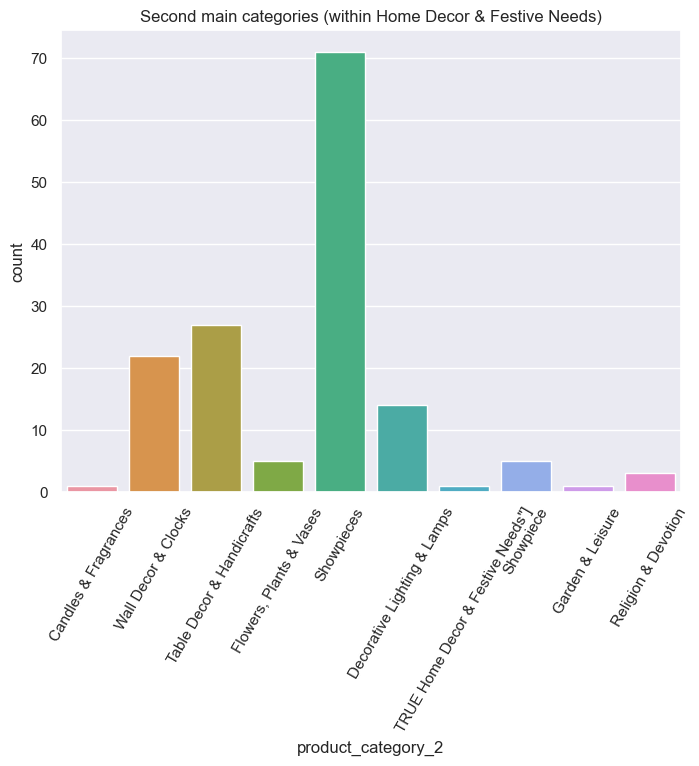

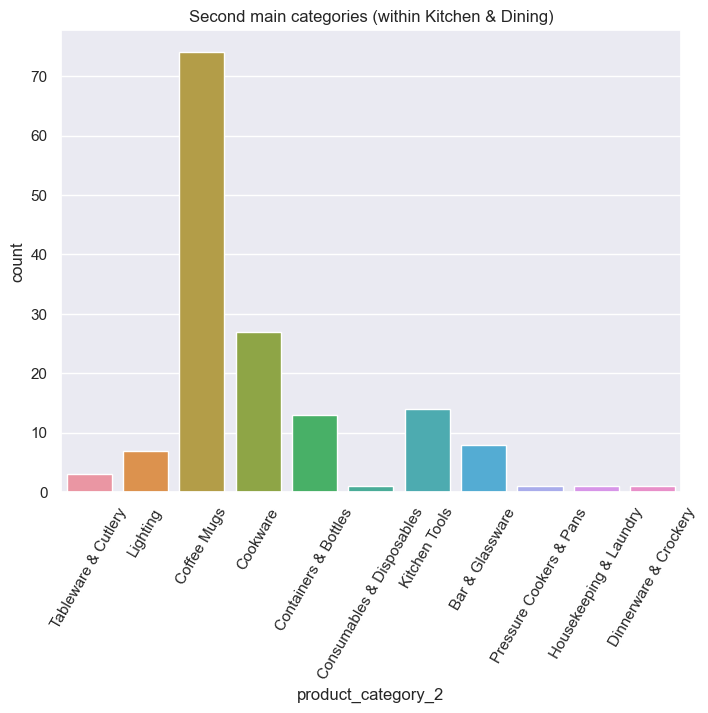

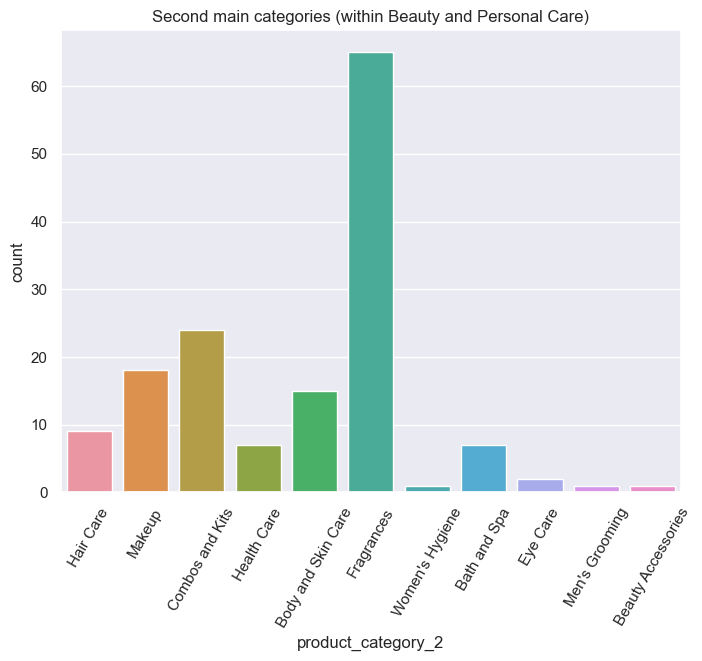

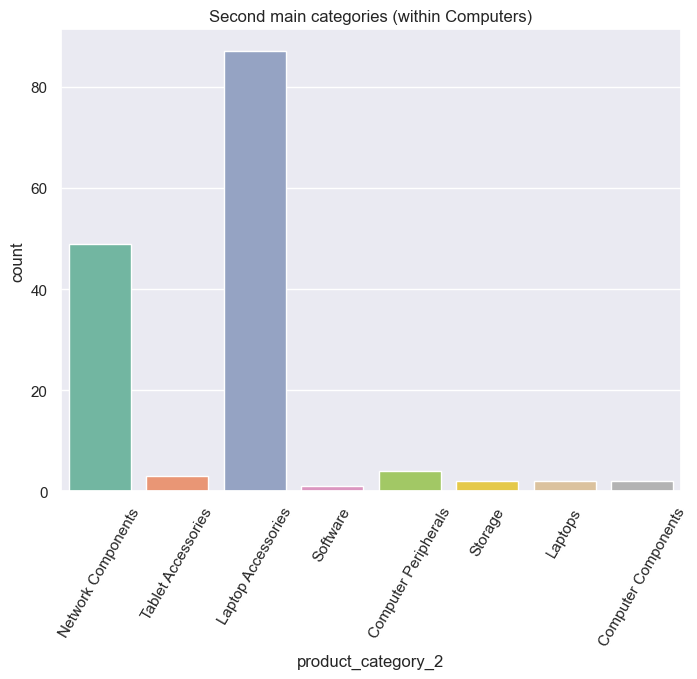

In [34]:
# Loop over main categories and display second main categories
for category in df['product_category_1'].unique():
    display_countplot(data=df[df['product_category_1'] == category], x='product_category_2', figsize=(8, 6),
                      xrotation=60, title="Second main categories (within " + category + ")")
    plt.show()
    print("\n\n")

I decide to create new product categories with a dictionary based on the first and second categories.

In [35]:
# New categories dictionary
products_dict = {
    'Bed Linen': ['Bed Linen'],
    'Bath Linen': ['Bath Linen'],
    'Kitchen & Dining Linen': ['Kitchen & Dining Linen'],
    'Infant Wear': ['Infant Wear'],
    'Watches': ['Wrist Watches', 'Clocks'],
    'Showpieces': ['Showpiece', 'Showpieces'],
    'Table Decor & Handicraft': ['Table Decor & Handicraft'],
    'Wall Decor & Clocks':  ['Wall Decor & Clocks'],
    'Coffee Mugs': ['Coffee Mugs'],
    'Cookware': ['Cookware', 'Pressure Cookers & Pans'],
    'Containers & Glassware': ['Containers & Bottles', 'Bar & Glassware'],
    'Fragrances': ['Fragrances'],
    'Combos & Kits': ['Combos & Kits'],
    'Laptops & Accessories': ['Laptop Accessories', 'Laptops'],
    'Network Components': ['Network Components']
}

In [36]:
# Apply the dictionary
df['new_product_category'] = df.apply(apply_new_category, **products_dict, axis=1)

# Rename some of the categories
df['new_product_category'] = df['new_product_category'].replace({"Home Decor & Festive Needs Others": "Home Decor Others",
                                                                 "Beauty and Personal Care Others": "Beauty Others"})

print("There are {} newly created product categories.".format(df['new_product_category'].nunique()))

There are 19 newly created product categories.


Let's display the new product categories.

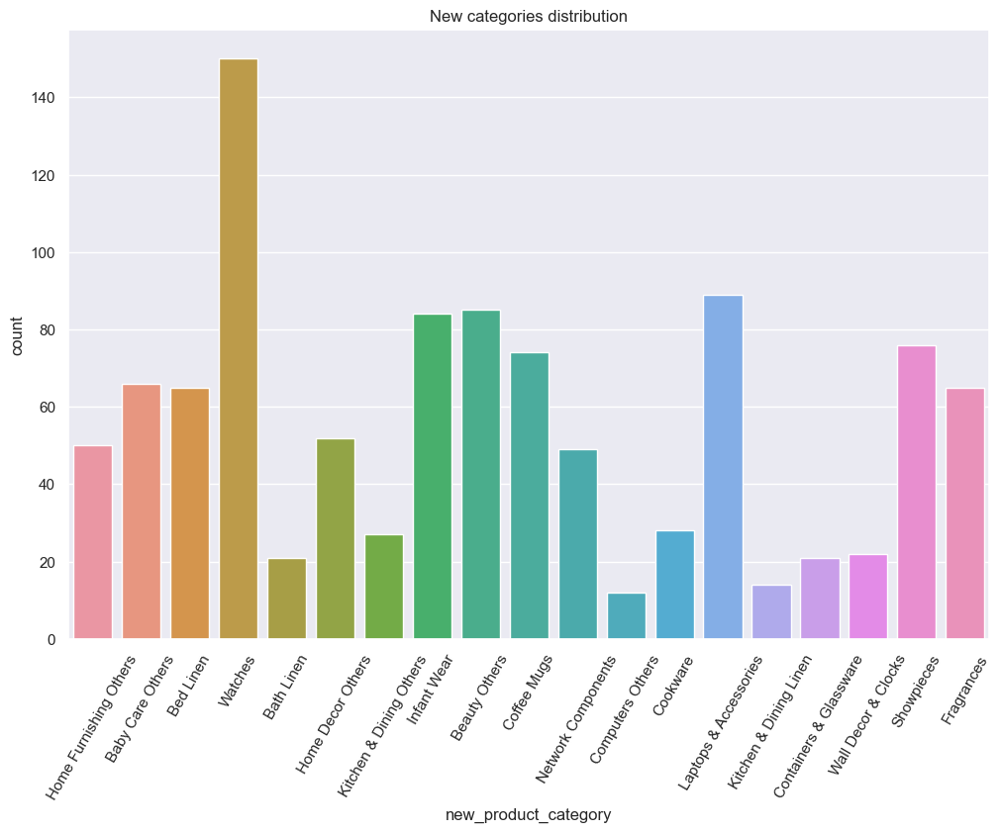

In [37]:
# Display new product categories
display_countplot(data=df, x='new_product_category', xrotation=60, title="New categories distribution")

## Product description

I use the *spaCy* library to tokenize the product descriptions.

count    1050.000000
mean       48.157143
std        43.891094
min        10.000000
25%        19.000000
50%        31.000000
75%        65.000000
max       326.000000
Name: description_len, dtype: float64

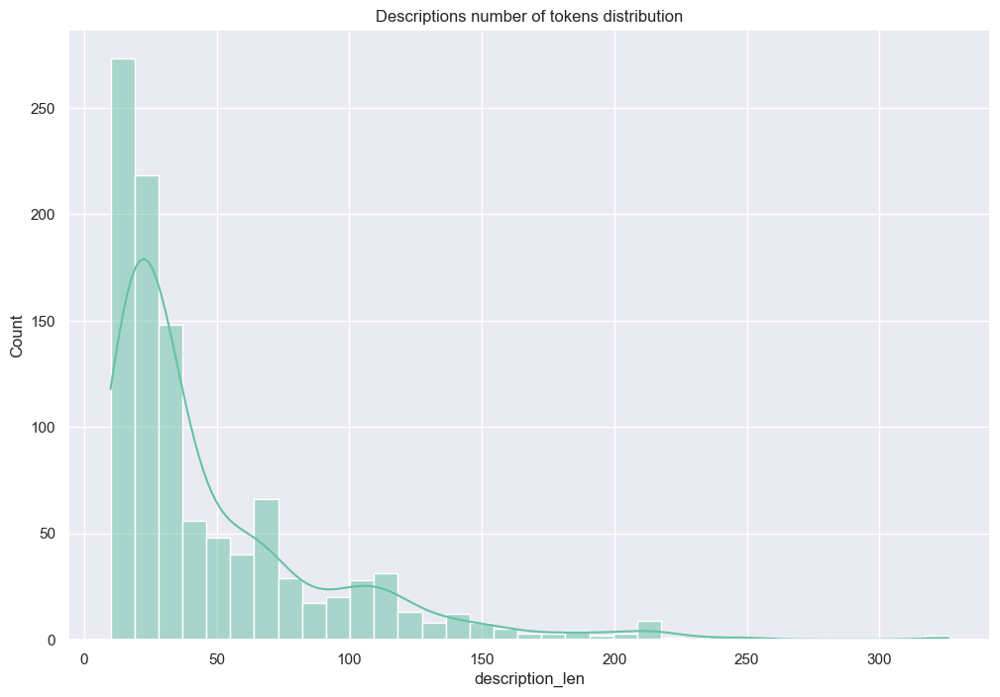

In [38]:
# Compute number of tokens
df['description_len'] = df['description'].apply(lambda x: len(spacy_tokenizer(x)))

# Info on description lengths
display(df['description_len'].describe())
# Display distribution
display_histplot(data=df, x='description_len', kde=True,
                 title="Descriptions number of tokens distribution")

In [39]:
# Five most common tokens
common_words = Counter(spacy_tokenizer(df['description'].sum())).most_common(10)

print("10 first frequent words are :\n", common_words)

10 first frequent words are :
 [('free', 618), ('products', 578), ('genuine', 564), ('shipping', 564), ('cash', 564), ('price', 559), ('replacement', 559), ('day', 553), ('guarantee', 471), ('mug', 437)]


### Word cloud

Corpus wordcloud :


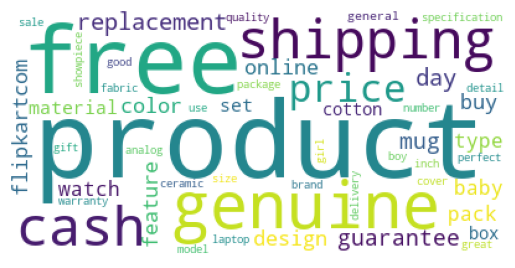


First description wordcloud :


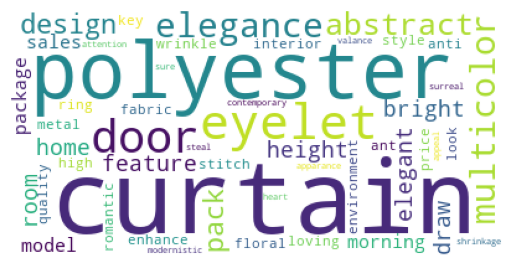

In [40]:
# Display word cloud of all corpus
print("Corpus wordcloud :")
display_wordcloud(' '.join(spacy_tokenizer(df['description'].sum())))

# Display WordCloud of first entry
print("\nFirst description wordcloud :")
display_wordcloud(' '.join(spacy_tokenizer(df['description'].iloc[0])))

# Data preparation

I define the corpus, images and labels.

In [41]:
# Define corpus (serie of descriptions)
corpus = df['description'].copy()

# Define images list
images = df['image'].copy()

# Define labels
labels = df['new_product_category'].copy()
n_labels = df['new_product_category'].nunique()
classes = sorted(df['new_product_category'].unique())
labels_encoded = labels.apply(lambda x: classes.index(x))

# Create dataframe
clean_df = corpus.to_frame().rename(columns={'description': 'corpus'})
clean_df['images'] = images
clean_df['labels'] = labels
clean_df['labels_encoded'] = labels_encoded

I split the dataset into train and test sets.

In [42]:
# Split 70% training and 30% testing
train_df, test_df = train_test_split(clean_df, train_size=0.7, stratify=clean_df['labels'], random_state=0)

# Split texts
train_texts = train_df['corpus'].to_list()
test_texts = test_df['corpus'].to_list()

# Split images
train_images = train_df['images'].to_list()
test_images = test_df['images'].to_list()

# Split labels
train_labels = train_df['labels'].to_list()
test_labels = test_df['labels'].to_list()
train_labels_encoded = train_df['labels_encoded'].to_list()
test_labels_encoded = test_df['labels_encoded'].to_list()

I save the preprocessed corpus as CSV file.

In [43]:
# Saving the CSV file as a text file
clean_df.to_csv('clean_df.csv', index=False)
train_df.to_csv('train_df.csv', index=False)
test_df.to_csv('test_df.csv', index=False)

I create dataframe to store the resuts.

In [44]:
# Create results dataframe
res_df = clean_df['labels'].to_frame()

# Create results for supervised models
res_sup_df = test_df['labels'].to_frame()

# Text features

## Bag of words models

### Simple count

#### Unigrams

I create the bag of words with a simple count of unigrams.

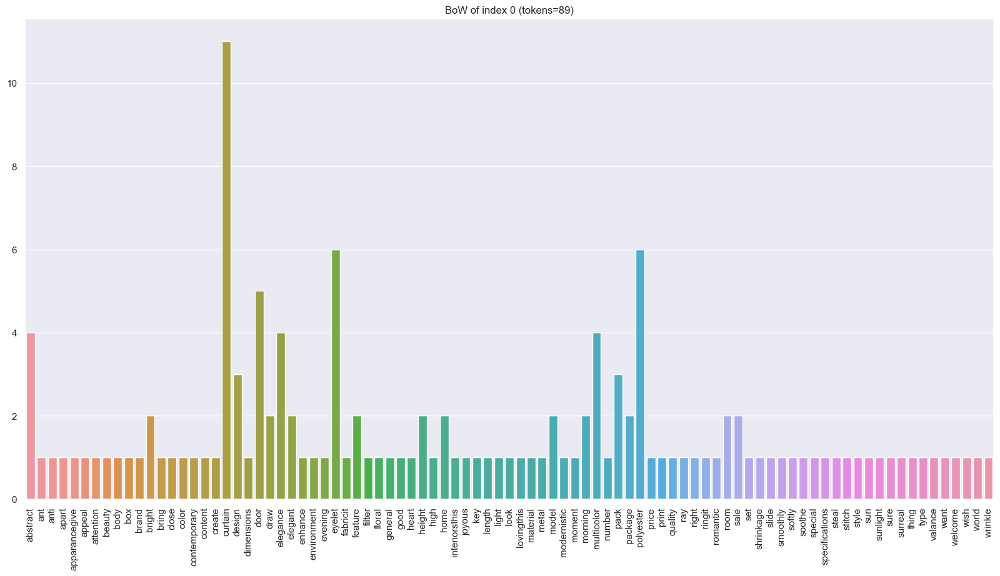

In [45]:
# Bag of words vectorizer
uni_vector = CountVectorizer(tokenizer=spacy_tokenizer, ngram_range=(1, 1))

# Fit bag of words on corpus
uni_features = uni_vector.fit_transform(corpus)

# Create bag of words dataframe
uni_df = pd.DataFrame(data=uni_features.toarray(), columns=uni_vector.get_feature_names_out())

# Display results of first entry
display_bow_by_index(uni_df, 0)

I reduce the dimensions of the bow data with the **t-SNE** algorithm and predict labels with the **KMeans** algorithm.

In [46]:
# t-SNE on 2 components
uni_tsne = TSNE_create(uni_df, n_components=2, perplexity=15)

# KMeans labels
uni_labels = KMeans_labels(uni_df, n_clusters=n_labels)

# Add category labels
uni_tsne['product_labels'] = labels
uni_tsne['kmeans_labels'] = uni_labels
res_df['labels_unigrams'] = uni_labels
display(uni_tsne.head(5))

,tSNE1,tSNE2,product_labels,kmeans_labels
0,49.014919,-0.492293,Home Furnishing Others,0
1,5.589062,-21.196497,Baby Care Others,0
2,2.791268,-20.668133,Baby Care Others,0
3,33.961716,-22.576069,Bed Linen,18
4,34.076534,-21.967321,Bed Linen,18


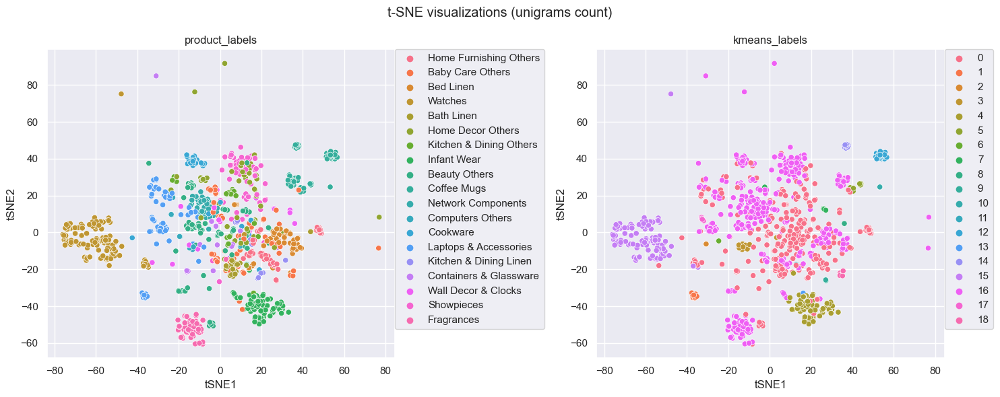

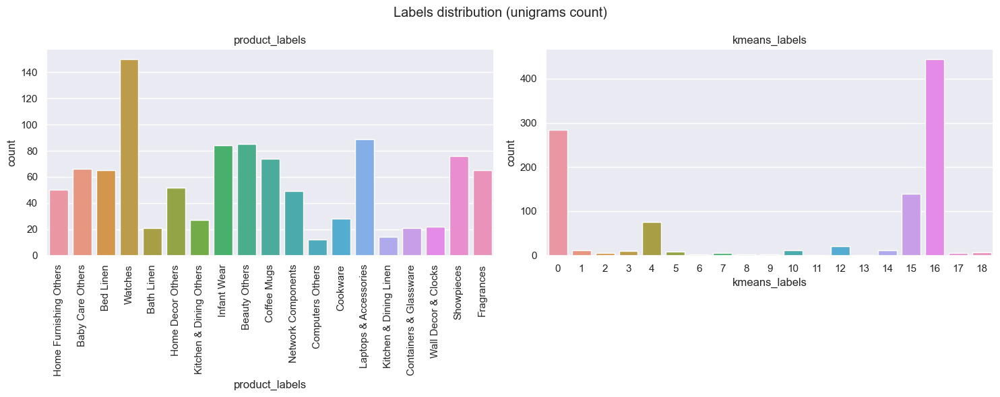

In [47]:
# Display projection
display_multihue_scatterplot(data=uni_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'kmeans_labels'],
                             title="t-SNE visualizations (unigrams count)")

# Display countplots
display_multi_countplot(data=uni_tsne, columns=['product_labels', 'kmeans_labels'], figsize=(15, 6),
                        title="Labels distribution (unigrams count)", xrotation=90)

#### Bigrams

I create the bag of words with a simple count of bigrams.

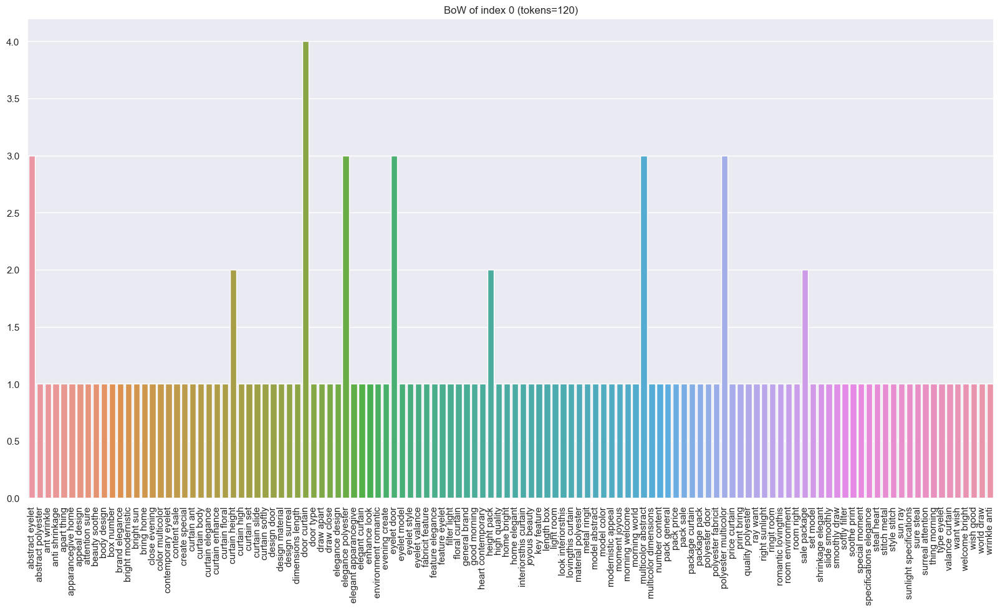

In [48]:
# Bag of words vectorizer
bi_vector = CountVectorizer(tokenizer=spacy_tokenizer, ngram_range=(2, 2))

# Fit bag of words on corpus
bi_features = bi_vector.fit_transform(corpus)

# Create bag of words dataframe
bi_df = pd.DataFrame(data=bi_features.toarray(), columns=bi_vector.get_feature_names_out())

# Display results of first entry
display_bow_by_index(bi_df, 0)

I reduce the dimensions of the bow data with the **t-SNE** algorithm and predict labels with the **KMeans** algorithm.

In [49]:
# t-SNE on 2 components
bi_tsne = TSNE_create(bi_df, n_components=2, perplexity=15)

# KMeans labels
bi_labels = KMeans_labels(bi_df, n_clusters=n_labels)

# Add category labels
bi_tsne['product_labels'] = labels
bi_tsne['kmeans_labels'] = bi_labels
res_df['labels_bigrams'] = bi_labels
display(bi_tsne.head(5))

,tSNE1,tSNE2,product_labels,kmeans_labels
0,26.073717,-36.746292,Home Furnishing Others,11
1,15.669624,-17.170362,Baby Care Others,1
2,24.109545,-15.220471,Baby Care Others,1
3,11.468682,-28.550293,Bed Linen,17
4,12.181023,-28.653116,Bed Linen,17


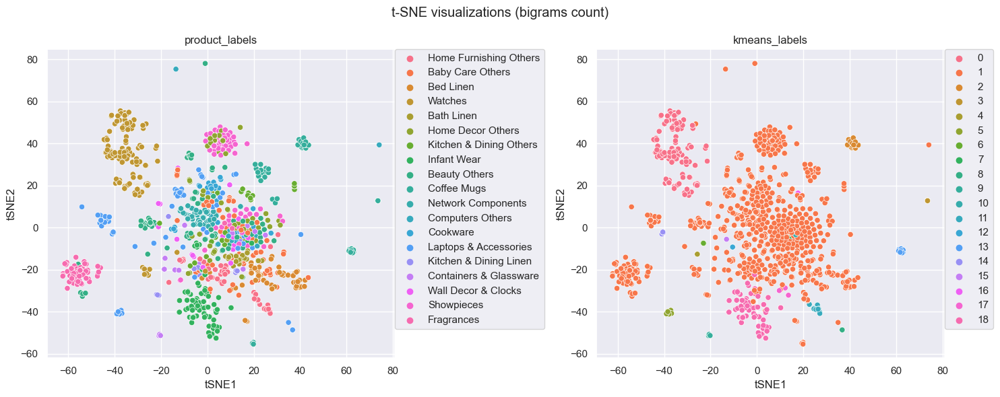

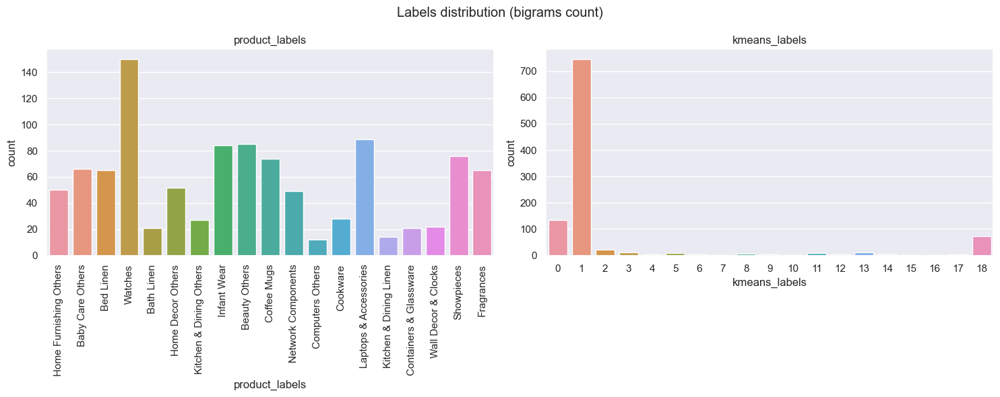

In [50]:
# Display projection
display_multihue_scatterplot(data=bi_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'kmeans_labels'],
                             title="t-SNE visualizations (bigrams count)")

# Display countplots
display_multi_countplot(data=bi_tsne, columns=['product_labels', 'kmeans_labels'], figsize=(15, 6),
                        title="Labels distribution (bigrams count)", xrotation=90)

### TF-IDF

I create the bag of words with *tf-idf* method.

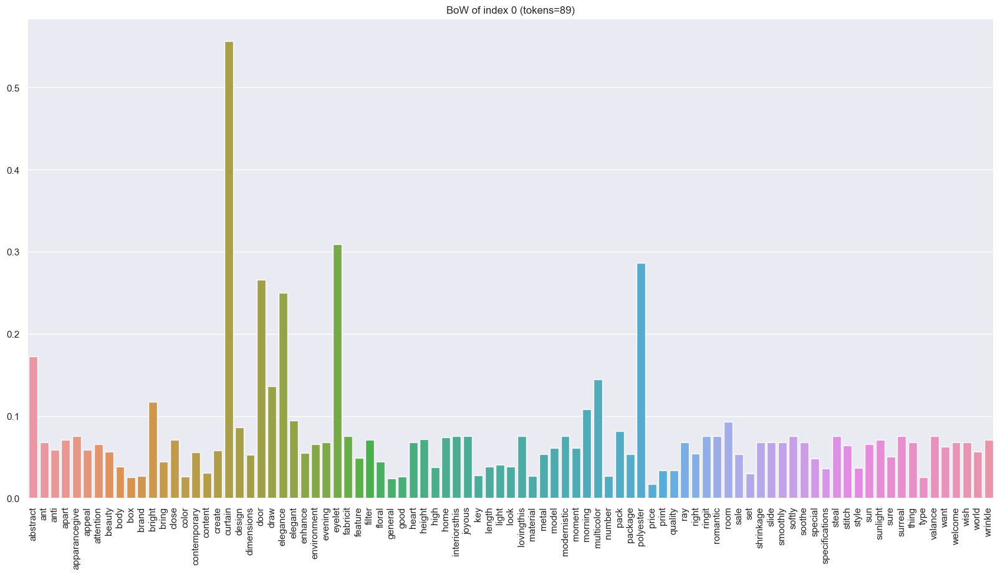

In [51]:
# Tf-idf vectorizer
tfidf_vector = TfidfVectorizer(tokenizer=spacy_tokenizer)

# Fit bag of words on corpus
tfidf_features = tfidf_vector.fit_transform(corpus)

# Create bag of words dataframe
tfidf_df = pd.DataFrame(data=tfidf_features.toarray(), columns=tfidf_vector.get_feature_names_out())

# Display results of first entry
display_bow_by_index(tfidf_df, 0)

I reduce the dimensions of the *tf-idf* data with the **t-SNE** algorithm and predict labels with the **KMeans** algorithm.

In [52]:
# t-SNE on 2 components
tfidf_tsne = TSNE_create(tfidf_df, n_components=2, perplexity=30)

# KMeans labels
tfidf_labels = KMeans_labels(tfidf_df, n_clusters=n_labels)

# Add category labels
tfidf_tsne['product_labels'] = labels
tfidf_tsne['kmeans_labels'] = tfidf_labels
res_df['labels_tfidf'] = tfidf_labels
display(tfidf_tsne.head(5))

,tSNE1,tSNE2,product_labels,kmeans_labels
0,-22.280048,12.605771,Home Furnishing Others,9
1,-31.057959,2.350181,Baby Care Others,6
2,-29.135317,1.528781,Baby Care Others,6
3,-19.258120,0.686972,Bed Linen,2
4,-19.575560,0.668574,Bed Linen,2


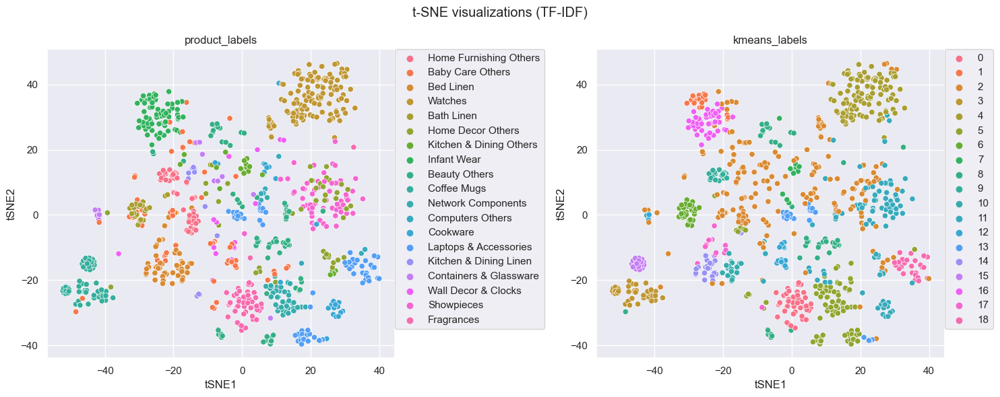

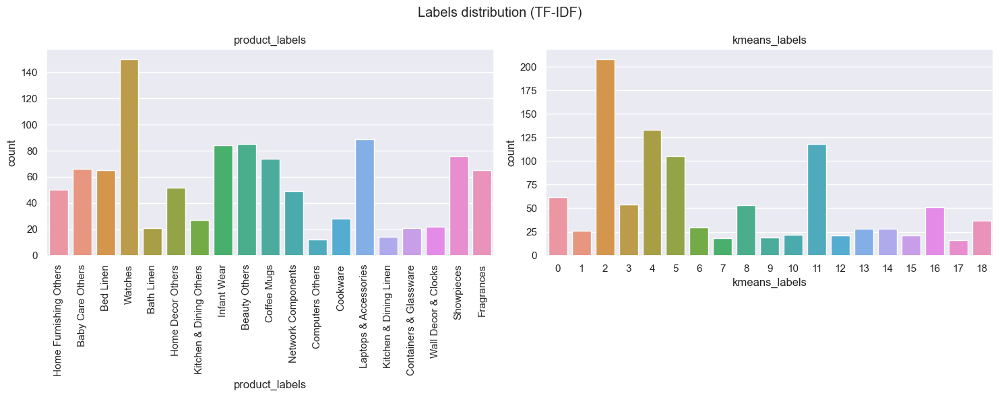

In [53]:
# Display projection
display_multihue_scatterplot(data=tfidf_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'kmeans_labels'],
                             title="t-SNE visualizations (TF-IDF)")

# Display countplots
display_multi_countplot(data=tfidf_tsne, columns=['product_labels', 'kmeans_labels'], figsize=(15, 6),
                        title="Labels distribution (TF-IDF)", xrotation=90)

## Word/sentence embedding

### FastText

I preprocess the data for **fastText**.

In [54]:
# Create dataframe
ft_df = clean_df[['corpus', 'labels']].copy()
ft_train_df = train_df[['corpus', 'labels']].copy()
ft_test_df = test_df[['corpus', 'labels']].copy()

# Prepare description with spaCy
ft_df['corpus'] = ft_df['corpus'].apply(lambda x: ' '.join(spacy_tokenizer(x)))
ft_train_df['corpus'] = ft_train_df['corpus'].apply(lambda x: ' '.join(spacy_tokenizer(x)))
ft_test_df['corpus'] = ft_test_df['corpus'].apply(lambda x: ' '.join(spacy_tokenizer(x)))

# Rename labels for fastText
ft_df['labels'] = ft_df['labels'].apply(lambda x: '__label__' + x.replace(' ', '_'))
ft_train_df['labels'] = ft_train_df['labels'].apply(lambda x: '__label__' + x.replace(' ', '_'))
ft_test_df['labels'] = ft_test_df['labels'].apply(lambda x: '__label__' + x.replace(' ', '_'))

# Save to text files
ft_df.to_csv('ft_prep_corpus.txt', index=False, sep=' ', header=None,
             quoting=csv.QUOTE_NONE, quotechar="", escapechar=" ")
ft_train_df.to_csv('ft_train_corpus.txt', index=False, sep=' ', header=None,
                   quoting=csv.QUOTE_NONE, quotechar="", escapechar=" ")
ft_test_df.to_csv('ft_test_corpus.txt', index=False, sep=' ', header=None,
                  quoting=csv.QUOTE_NONE, quotechar="", escapechar=" ")

#### Supervised

I train the fastText supervised classifier.

In [55]:
# Train model on training set
ft = fasttext.train_supervised(input='ft_train_corpus.txt', lr=1.0, epoch=25, wordNgrams=2)
ft_auto = fasttext.train_supervised(input='ft_train_corpus.txt', autotuneValidationFile='ft_test_corpus.txt')

# Test models on testing set
ft_test = ft.test('ft_test_corpus.txt')
ft_auto_test = ft_auto.test('ft_test_corpus.txt')

# Create dataframe for results
ft_res = pd.DataFrame({'model': ['bigrams', 'autotuned'],
                       'precision': [ft_test[1], ft_auto_test[1]],
                       'recall': [ft_test[2], ft_auto_test[2]],
                       'test_size': [ft_test[0], ft_auto_test[0]]})
print("FastText models on testing set:")
display(ft_res)

Read 0M words
Number of words:  3627
Number of labels: 19
Progress: 100.0% words/sec/thread: 1270704 lr:  0.000000 avg.loss:  0.362222 ETA:   0h 0m 0s
Progress: 100.0% Trials:  500 Best score:  0.923810 ETA:   0h 0m 0s
Training again with best arguments
Read 0M words
Number of words:  3627
Number of labels: 19
Progress: 100.0% words/sec/thread:  371826 lr:  0.000000 avg.loss:  0.315748 ETA:   0h 0m 0s


FastText models on testing set:


,model,precision,recall,test_size
0,bigrams,0.895238,0.895238,315
1,autotuned,0.895238,0.895238,315


I compute the description vectors and predict the associated labels.

I display the results with a **t-SNE**.

In [56]:
# Get vectors for each description
ft_vectors = ft_test_df['corpus'].apply(lambda x: ft.get_sentence_vector(x)).to_list()

# t-SNE on 2 components
ft_tsne = TSNE_create(np.array(ft_vectors), n_components=2, perplexity=30)

# Predict corpus
ft_predictions = ft.predict(ft_test_df['corpus'].to_list())
ft_labels = [name[0][9:].replace("_", " ") for name in ft_predictions[0]]  # Remove __label__ prefix
ft_tsne['product_labels'] = test_labels
ft_tsne['fasttext_labels'] = ft_labels
res_sup_df['labels_ft'] = ft_labels
display(ft_tsne.head(5))

,tSNE1,tSNE2,product_labels,fasttext_labels
0,16.628517,-8.655158,Watches,Watches
1,-6.632698,4.838180,Home Decor Others,Home Decor Others
2,11.595164,8.243111,Network Components,Network Components
3,5.305330,10.209188,Laptops & Accessories,Laptops & Accessories
4,6.302890,10.480731,Laptops & Accessories,Laptops & Accessories


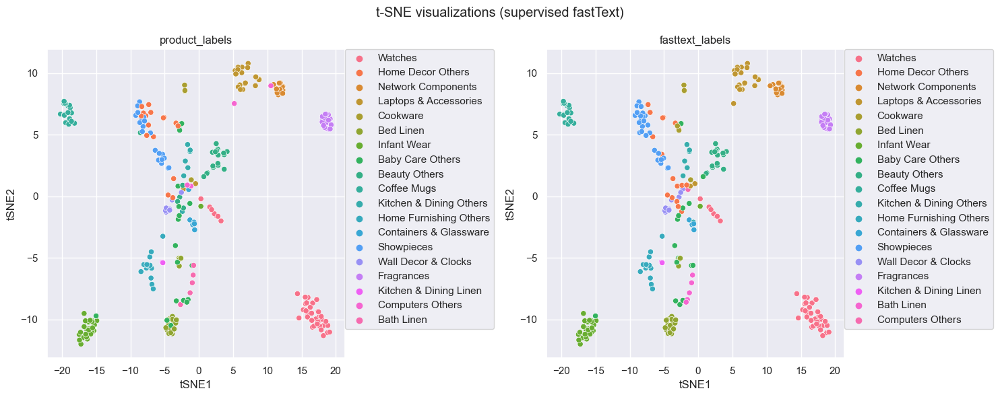

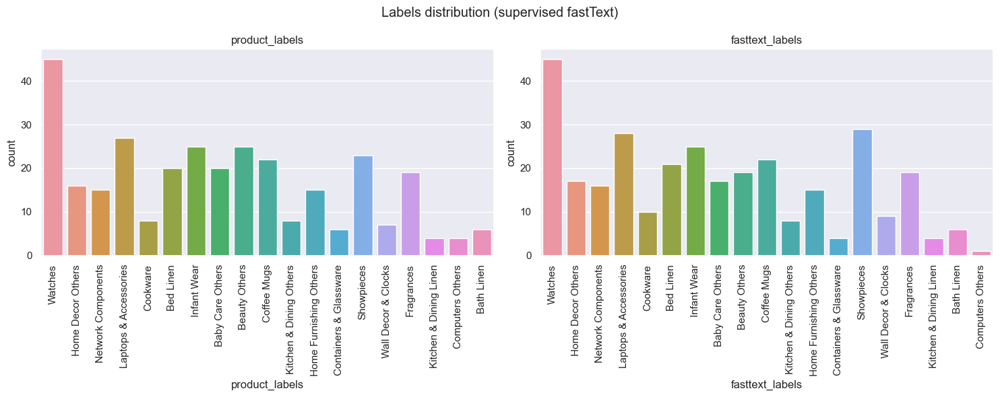

In [57]:
# Display projection
display_multihue_scatterplot(data=ft_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'fasttext_labels'],
                             title="t-SNE visualizations (supervised fastText)")

# Display countplots
display_multi_countplot(data=ft_tsne, columns=['product_labels', 'fasttext_labels'], figsize=(15, 6),
                        title="Labels distribution (supervised fastText)", xrotation=90)

I compute the precision of the first three predictions for each description.

In [58]:
ft_top_pred = []
ft_top_n = 3

# Loop over images
for i, text in enumerate(ft_test_df['corpus'].to_list()):
    # Init prediction
    pred = False

    # Compute prediction
    predictions = ft.predict(text, k=ft_top_n)
    text_classes = [label[9:].replace("_", " ") for label in predictions[0]]

    # Check result
    if test_labels[i] in text_classes:
        pred = True

    # Add result
    ft_top_pred.append(pred)

I compute the accuracy of the top three predictions

In [59]:
ft_top_accuracy = sum(ft_top_pred) / len(ft_top_pred)

print("The precision of the fastText model with the top three predictions is {:.2f} %".format(ft_top_accuracy*100))

The precision of the ResNet50 model with the top three predictions is 98.10 %


#### Unsupervised

I train the fasttext unsupervised classifier.

In [60]:
# Train model on training set
ft_unsup = fasttext.train_unsupervised(input='ft_prep_corpus.txt', lr=0.3, epoch=25, wordNgrams=2)

Read 0M words
Number of words:  1365
Number of labels: 19
Progress: 100.0% words/sec/thread:  152117 lr:  0.000000 avg.loss: 10.007057 ETA:   0h 0m 0s


I reduce the dimensions of the unsupervised data with the **t-SNE** algorithm and predict labels with the **KMeans** algorithm.

In [61]:
# Get vectors for each description
ft_unsup_vectors = ft_df['corpus'].apply(lambda x: ft_unsup.get_sentence_vector(x)).to_list()

# t-SNE on 2 components
ft_unsup_tsne = TSNE_create(np.array(ft_unsup_vectors), n_components=2, perplexity=40)

# KMeans clustering
ft_unsup_labels = KMeans_labels(np.array(ft_unsup_vectors), n_clusters=n_labels)
ft_unsup_tsne['product_labels'] = labels
ft_unsup_tsne['kmeans_labels'] = ft_unsup_labels
res_df['labels_ft_unsup'] = ft_unsup_labels
display(ft_unsup_tsne.head(5))

,tSNE1,tSNE2,product_labels,kmeans_labels
0,-33.852497,5.484763,Home Furnishing Others,14
1,-27.152979,13.509919,Baby Care Others,14
2,-26.875210,13.826872,Baby Care Others,18
3,-26.942305,10.455104,Bed Linen,14
4,-26.612993,10.429909,Bed Linen,14


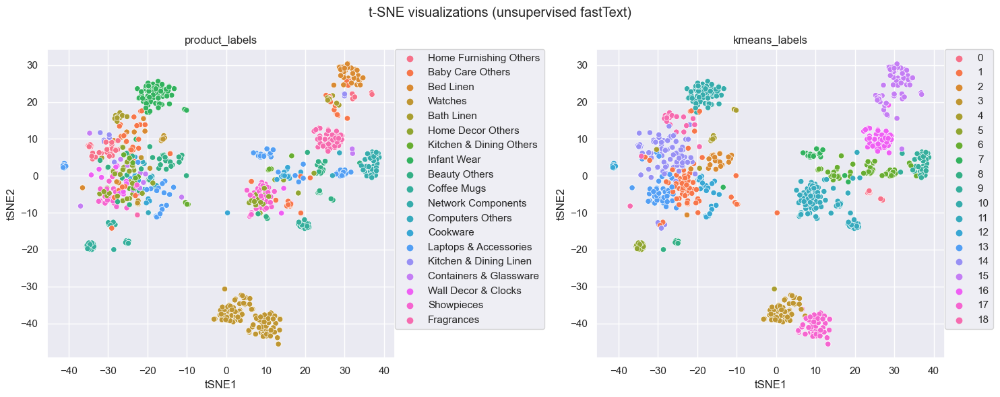

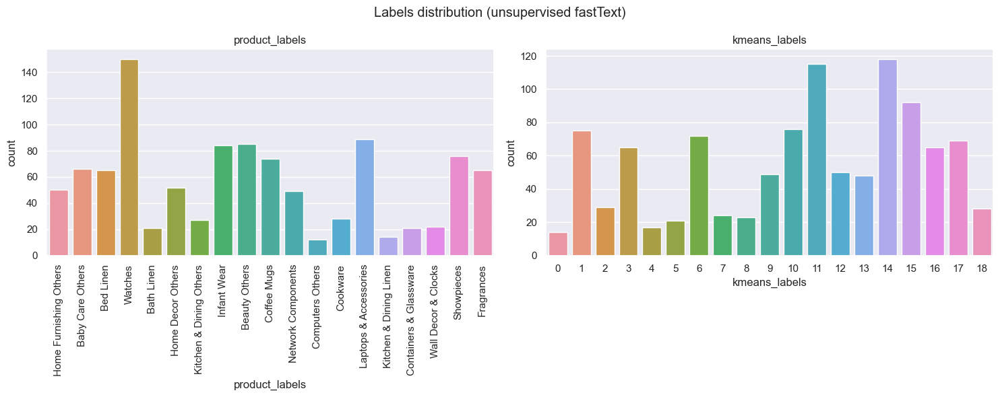

In [62]:
# Display projection
display_multihue_scatterplot(data=ft_unsup_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'kmeans_labels'],
                             title="t-SNE visualizations (unsupervised fastText)")

# Display countplots
display_multi_countplot(data=ft_unsup_tsne, columns=['product_labels', 'kmeans_labels'], figsize=(15, 6),
                        title="Labels distribution (unsupervised fastText)", xrotation=90)

### BERT

I create the BERT tokenizer.

In [63]:
# Bert tokenizer
bert_tokenizer = BertTokenizerFast.from_pretrained('bert-base-uncased')

I load my finetuned BERT model (see "projet6_bert_tuning.ipnyb").

In [64]:
# Load trained bert model
bert_model = BertForSequenceClassification.from_pretrained('./bert_save/', num_labels=n_labels)

I encode the corpus and prepare the tensor for the bert model.

In [65]:
# Encode corpus
test_corpus_encoded = bert_tokenizer(test_texts, max_length=129, truncation=True, padding=True)

# Create tensors
bert_input_ids = torch.tensor(test_corpus_encoded['input_ids'])
bert_attention_mask = torch.tensor(test_corpus_encoded['attention_mask'])

I apply the trained bert model.

In [66]:
# Apply bert model
with torch.no_grad():
    bert_output = bert_model(bert_input_ids, attention_mask=bert_attention_mask,
                             output_hidden_states=True,
                             return_dict=True)

I compute the features and the labels from the BERT ouput.

In [67]:
# Define features (768 BERT dimensions)
bert_features = bert_output.hidden_states[0].numpy().mean(axis=1)
print(bert_features.shape)

# Get labels predictions from logits
bert_labels = bert_output.logits.numpy().argmax(axis=1)
print(bert_labels.shape)
bert_labels = [classes[label] for label in bert_labels]

(315, 768)
(315,)


I reduce the dimensions of the BERT data with the **t-SNE** algorithm.

In [68]:
# t-SNE on 2 components
bert_tsne = TSNE_create(bert_features, n_components=2, perplexity=20)

# Add category labels
bert_tsne['product_labels'] = test_labels
bert_tsne['bert_labels'] = bert_labels
res_sup_df['labels_bert'] = bert_labels
display(bert_tsne.head(5))

,tSNE1,tSNE2,product_labels,bert_labels
0,0.477882,-4.541807,Watches,Watches
1,-36.872761,0.895833,Home Decor Others,Showpieces
2,-16.785141,-0.148089,Network Components,Laptops & Accessories
3,-7.476473,9.896000,Laptops & Accessories,Laptops & Accessories
4,-7.312081,9.730452,Laptops & Accessories,Laptops & Accessories


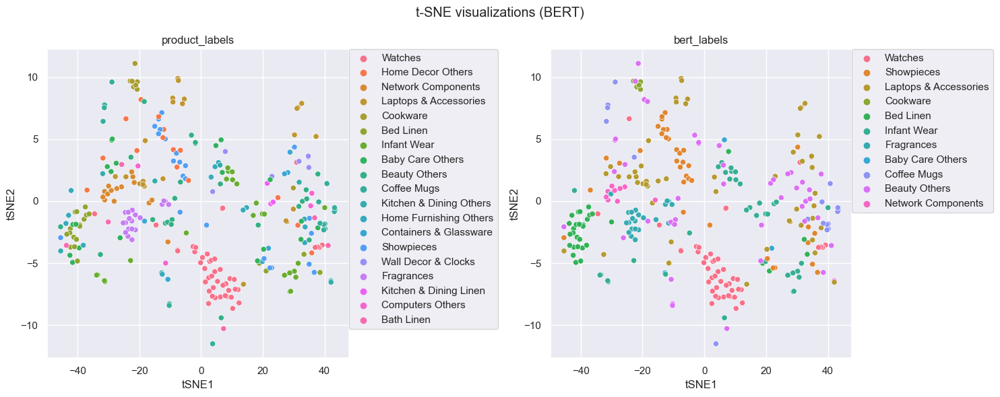

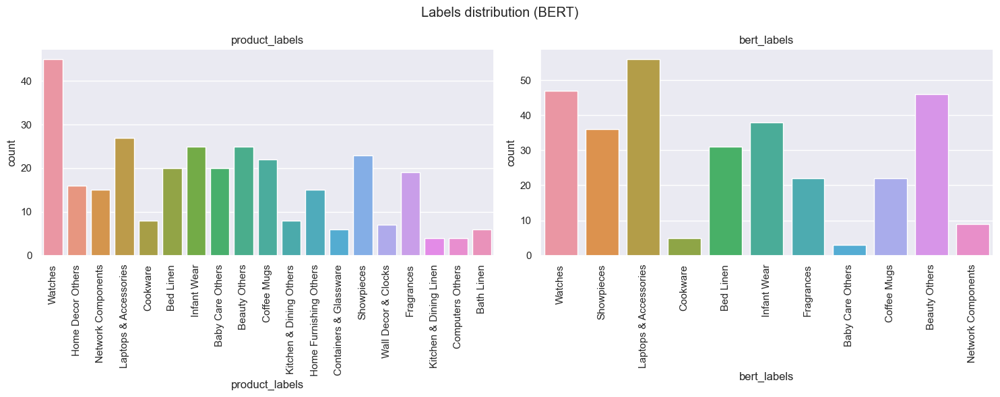

In [69]:
# Display projection
display_multihue_scatterplot(data=bert_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'bert_labels'],
                             title="t-SNE visualizations (BERT)")

# Display countplots
display_multi_countplot(data=bert_tsne, columns=['product_labels', 'bert_labels'], figsize=(15, 6),
                        title="Labels distribution (BERT)", xrotation=90)

I compute the precision of the first three predictions for each description.

In [70]:
bert_top_pred = []
bert_top_n = 3

# Loop over images
for i, logits in enumerate(bert_output.logits.numpy()):
    # Init prediction
    pred = False

    # Compute prediction
    predictions = logits.argpartition(-bert_top_n)[-bert_top_n:]

    # Check result
    if test_labels_encoded[i] in predictions.tolist():
        pred = True

    # Add result
    bert_top_pred.append(pred)

I compute the accuracy of the top three predictions

In [71]:
bert_top_accuracy = sum(bert_top_pred) / len(bert_top_pred)

print("The precision of the BERT model with the top three predictions is {:.2f} %".format(bert_top_accuracy*100))

The precision of the BERT model with the top three predictions is 76.19 %


### Universal Sentence Encoder

I load the **USE** module.

In [76]:
# USE module url
use_module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"

# Load USE module
use_module = hub.load(use_module_url)
use_hub_layer = hub.KerasLayer(use_module_url, input_shape=[], dtype=tf.string, trainable=True)

2022-12-20 13:35:56.284334: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


I create the model architecture.

In [77]:
# Create USE model
use_model = tf.keras.Sequential()
use_model.add(use_hub_layer)
use_model.add(tf.keras.layers.Dense(500))
use_model.add(tf.keras.layers.Dense(100))
use_model.add(tf.keras.layers.Dense(19, activation='softmax'))
use_model.summary()

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 512)               256797824 
                                                                 
 dense (Dense)               (None, 500)               256500    
                                                                 
 dense_1 (Dense)             (None, 100)               50100     
                                                                 
 dense_2 (Dense)             (None, 19)                1919      
                                                                 
Total params: 257,106,343
Trainable params: 257,106,343
Non-trainable params: 0
_________________________________________________________________


I train the model on the training data.

In [78]:
# Compile the model
use_model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

# Train the model
use_history = use_model.fit(x=train_texts, y=train_labels_encoded, shuffle=True, epochs=24, batch_size=1024)

Epoch 1/24
1/1 [==============================] - 8s 8s/step - loss: 2.9710 - accuracy: 0.0803
Epoch 2/24
1/1 [==============================] - 2s 2s/step - loss: 2.7742 - accuracy: 0.3306
Epoch 3/24
1/1 [==============================] - 2s 2s/step - loss: 2.6117 - accuracy: 0.3293
Epoch 4/24
1/1 [==============================] - 2s 2s/step - loss: 2.4709 - accuracy: 0.3415
Epoch 5/24
1/1 [==============================] - 2s 2s/step - loss: 2.3347 - accuracy: 0.3701
Epoch 6/24
1/1 [==============================] - 2s 2s/step - loss: 2.1918 - accuracy: 0.4327
Epoch 7/24
1/1 [==============================] - 2s 2s/step - loss: 2.0411 - accuracy: 0.5633
Epoch 8/24
1/1 [==============================] - 2s 2s/step - loss: 1.8881 - accuracy: 0.6776
Epoch 9/24
1/1 [==============================] - 2s 2s/step - loss: 1.7381 - accuracy: 0.7075
Epoch 10/24
1/1 [==============================] - 2s 2s/step - loss: 1.5949 - accuracy: 0.7211
Epoch 11/24
1/1 [==============================] 

I embed the test data.

In [79]:
# Embed corpus
use_features = use_module(test_texts)

I predict the classes of the test data.

In [80]:
# Test predictions
use_predictions = use_model.predict(test_texts)
use_labels = tf.argmax(use_predictions, axis=-1)
use_labels = [classes[label] for label in use_labels]

10/10 [==============================] - 0s 10ms/step


I reduce the dimensions of the USE data with the **t-SNE** algorithm.

In [81]:
# t-SNE on 2 components
use_tsne = TSNE_create(use_features, n_components=2, perplexity=20)

# Add category labels
use_tsne['product_labels'] = test_labels
use_tsne['use_labels'] = use_labels
res_sup_df['use_labels'] = use_labels
display(use_tsne.head(5))

,tSNE1,tSNE2,product_labels,use_labels
0,-13.008142,28.449875,Watches,Watches
1,0.943776,-7.131150,Home Decor Others,Showpieces
2,-15.947369,-9.445478,Network Components,Network Components
3,-27.179361,-9.829228,Laptops & Accessories,Laptops & Accessories
4,-27.041473,-10.626921,Laptops & Accessories,Laptops & Accessories


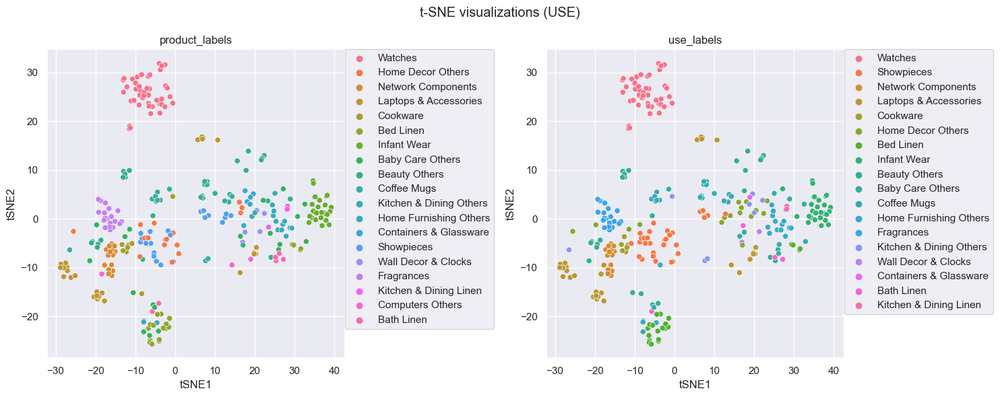

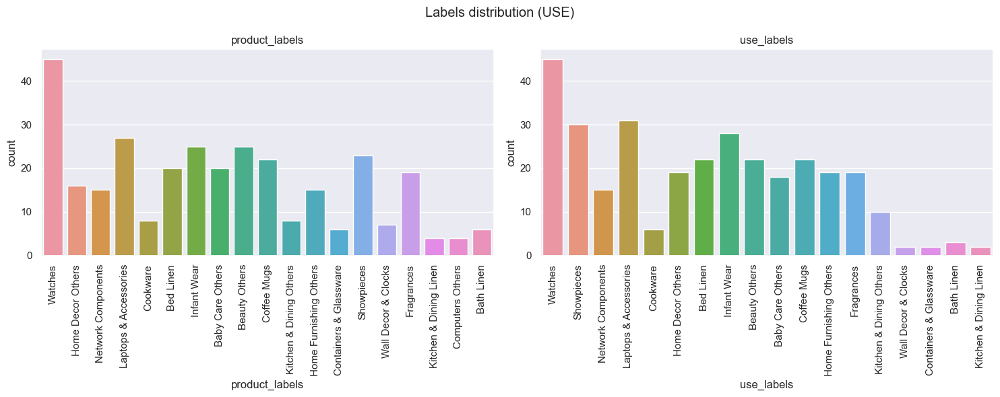

In [82]:
# Display projection
display_multihue_scatterplot(data=use_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'use_labels'],
                             title="t-SNE visualizations (USE)")

# Display countplots
display_multi_countplot(data=use_tsne, columns=['product_labels', 'use_labels'], figsize=(15, 6),
                        title="Labels distribution (USE)", xrotation=90)

I compute the precision of the first three predictions for each description.

In [83]:
use_top_pred = []
use_top_n = 3

# Loop over images
for i, tensors in enumerate(use_predictions):
    # Init prediction
    pred = False

    # Compute prediction
    predictions = tensors.argpartition(-use_top_n)[-use_top_n:]

    # Check result
    if test_labels_encoded[i] in predictions.tolist():
        pred = True

    # Add result
    use_top_pred.append(pred)

I compute the accuracy of the top three predictions

In [84]:
use_top_accuracy = sum(use_top_pred) / len(use_top_pred)

print("The precision of the USE model with the top three predictions is {:.2f} %".format(use_top_accuracy*100))

The precision of the USE model with the top three predictions is 96.83 %


# Image features

The products image file name is given in the column *image* of the dataframe.

In [85]:
# Display 5 first images
images[:5]

0    55b85ea15a1536d46b7190ad6fff8ce7.jpg
1    7b72c92c2f6c40268628ec5f14c6d590.jpg
2    64d5d4a258243731dc7bbb1eef49ad74.jpg
3    d4684dcdc759dd9cdf41504698d737d8.jpg
4    6325b6870c54cd47be6ebfbffa620ec7.jpg
Name: image, dtype: object

I load all images from files.

In [86]:
# Load images in dataframe order
images_list = load_all_images_from_path(images.to_list(), work_path + project_path + "/Flipkart/Images/")

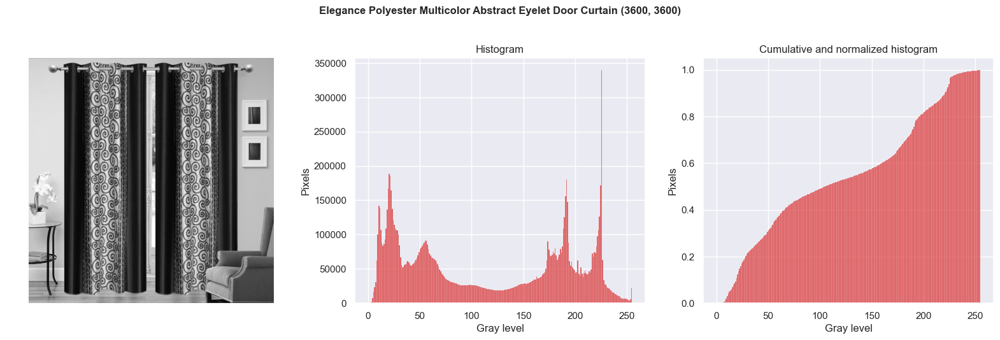

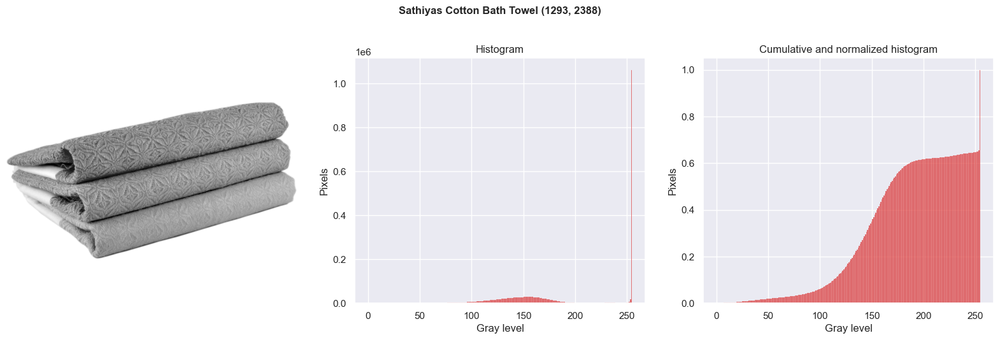

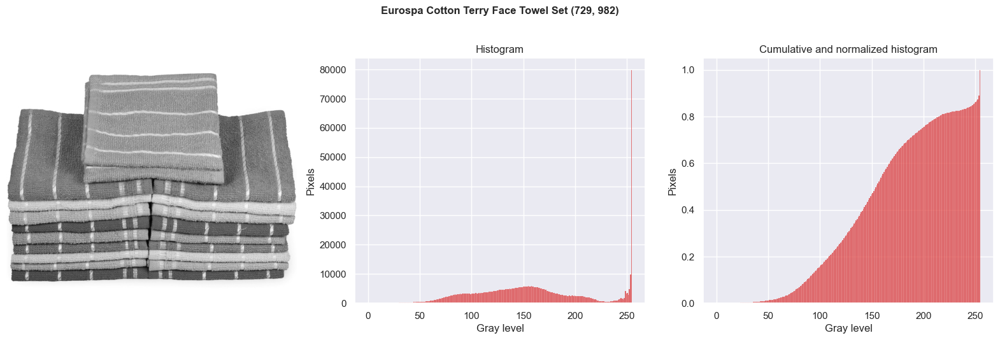

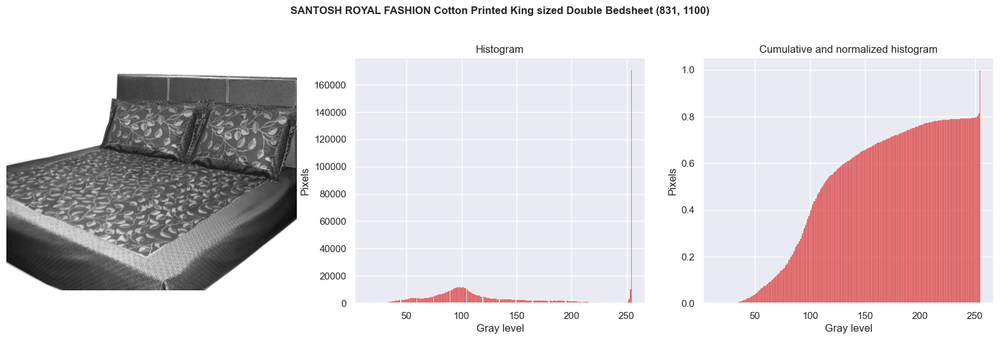

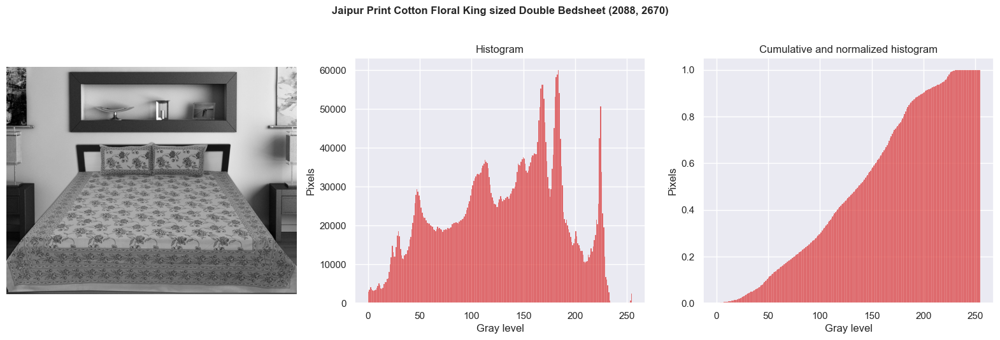

In [87]:
# Display histograms of df head
for i, image_cv in enumerate(images_list[0:5]):
    product_name = df['product_name'].iloc[i]

    # Display histograms
    display_image_histograms(product_name, image_cv)

### Preprocess images

I blurr and equalize the images.

In [88]:
prep_images_list = []

# Loop over images
for image_cv in images_list:
    # Blurring
    prep_image_cv = cv2.GaussianBlur(image_cv, (5, 5), 0)

    # Equalization
    prep_image_cv = cv2.equalizeHist(prep_image_cv)

    prep_images_list.append(prep_image_cv)

I display before/after preprocess of first image.

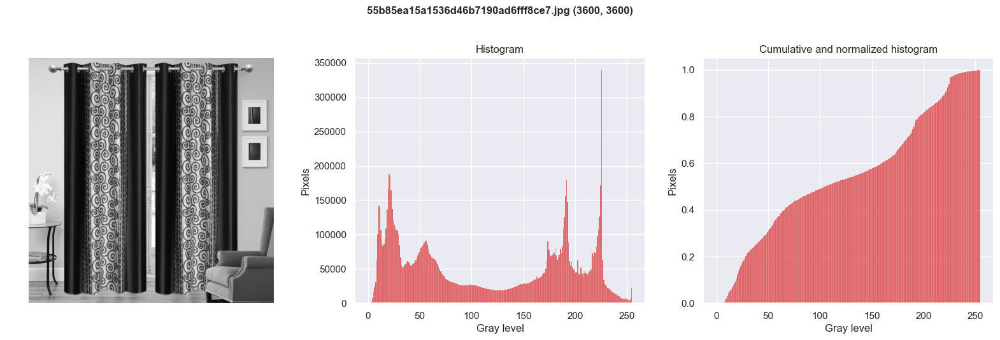

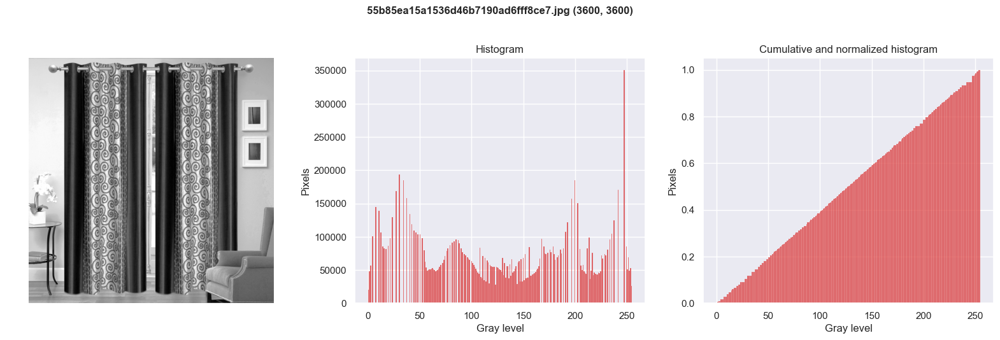

In [89]:
# Get first image
index = 0
first_image_name = df['image'].iloc[index]
first_image_cv = images_list[index]
first_prep_image_cv = prep_images_list[index]

# Display first image brefore preprocess
display_image_histograms(first_image_name, first_image_cv)

# Display first image after preprocess
display_image_histograms(first_image_name, first_prep_image_cv)

## ORB

In [90]:
# Create ORB detector
orb = cv2.ORB_create(nfeatures=2000)

I display the keypoints of the first image.

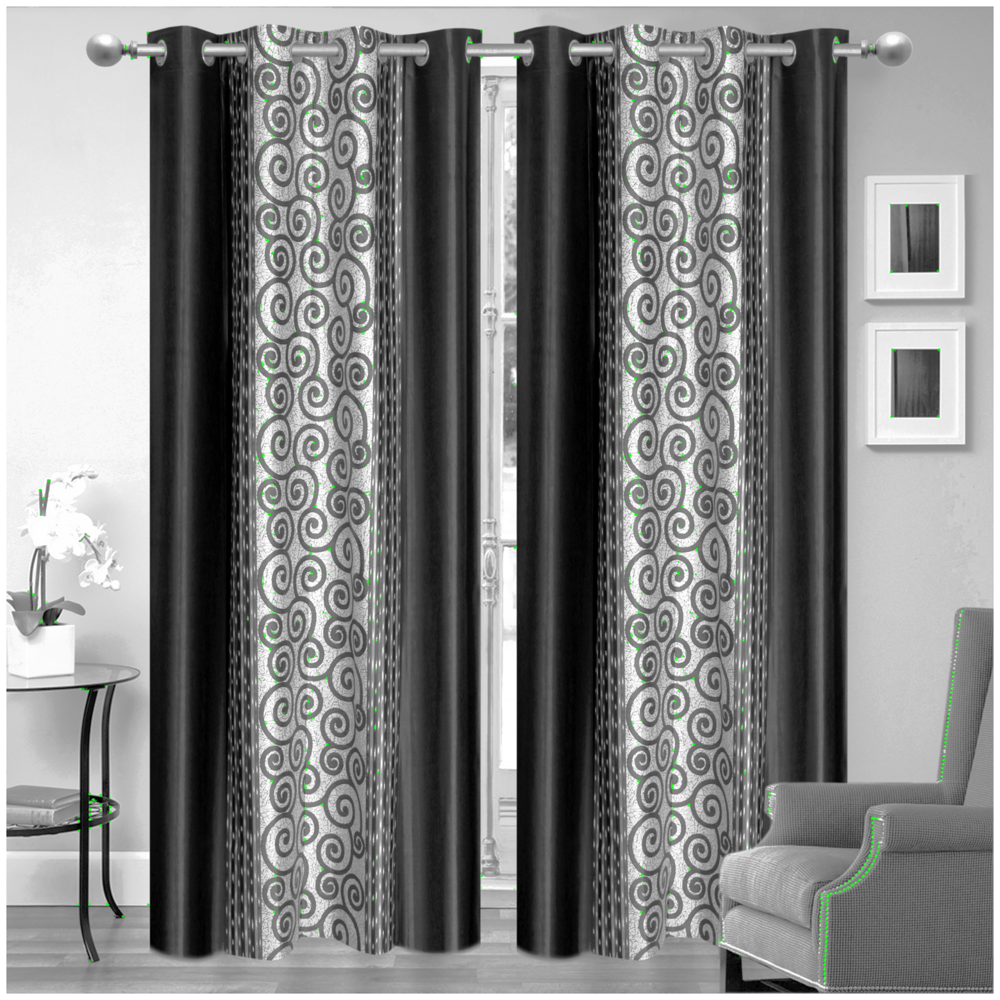

In [91]:
# Detect keypoints and descriptors of first image
kp_img, des_img = orb.detectAndCompute(first_prep_image_cv, None)

# Draw key point on image
result_img = cv2.drawKeypoints(first_prep_image_cv, kp_img, None, color=(0, 255, 0), flags=0)
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis("off")
plt.show()

I create a list of all descriptors found with ORB.

In [92]:
orb_descriptors = []

# Loop over preprocess images list
for image_cv in prep_images_list:
    # Get keypoints and descriptors
    kp_img, des_img = orb.detectAndCompute(image_cv, None)

    # Add descriptors
    orb_descriptors.append(des_img)

# List of all descriptors
orb_descriptors_all = np.concatenate(orb_descriptors, axis=0)

I create the visual words with a *MiniBatchKMeans* algorithm.

In [93]:
# Estimated number of visual words (clusters)
k_clusters = int(round(np.sqrt(orb_descriptors_all.shape[0]), 0))
print("Estimated number of visual words : ", k_clusters)

# Clustering
mini_kmeans = MiniBatchKMeans(n_clusters=k_clusters, init_size=3*k_clusters, random_state=0, batch_size=4096)
mini_kmeans.fit(orb_descriptors_all)

Estimated number of visual words :  1401


MiniBatchKMeans(batch_size=4096, init_size=4203, n_clusters=1401,
                random_state=0)

I create bag of visual words for each image.

In [94]:
orb_bovw = []

# Loop over descriptors
for desc in orb_descriptors:
    vw = visual_words_from_image(mini_kmeans, desc)
    orb_bovw.append(vw)

I display the bag of visual words of the first product.

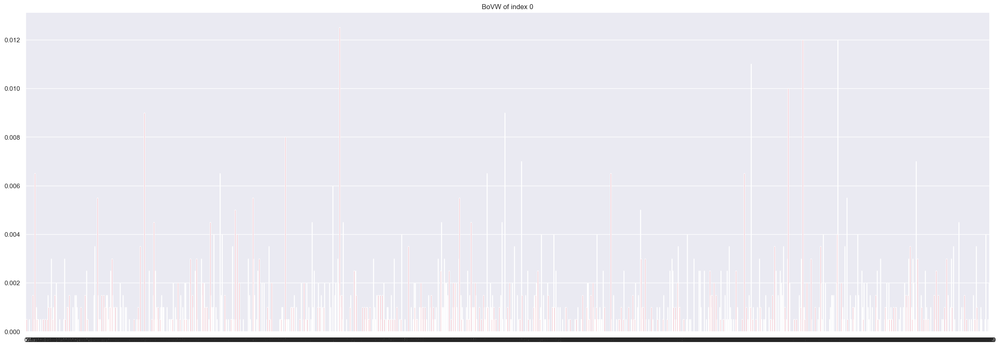

In [95]:
index = 0

display_barplot(x=[*range(len(orb_bovw[index]))], y=orb_bovw[index], figsize=(30, 10),
                title="BoVW of index "+str(index), palette=sns.color_palette("husl", 1))

In [96]:
# t-SNE on 2 components
orb_tsne = TSNE_create(np.array(orb_bovw), n_components=2, perplexity=10)

# Predict labels
orb_labels = KMeans_labels(orb_bovw, n_clusters=n_labels)

orb_tsne['product_labels'] = labels
orb_tsne['orb_labels'] = orb_labels
res_df['orb_labels'] = orb_labels
display(orb_tsne.head(5))

,tSNE1,tSNE2,product_labels,orb_labels
0,-65.760086,7.781639,Home Furnishing Others,6
1,-49.352783,9.238732,Baby Care Others,6
2,-7.297513,-0.805340,Baby Care Others,11
3,-57.874519,6.779400,Bed Linen,6
4,-23.262161,4.931658,Bed Linen,3


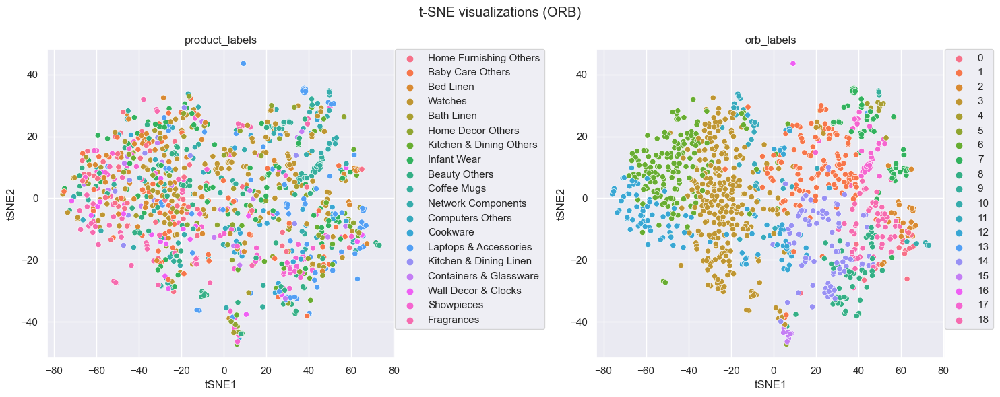

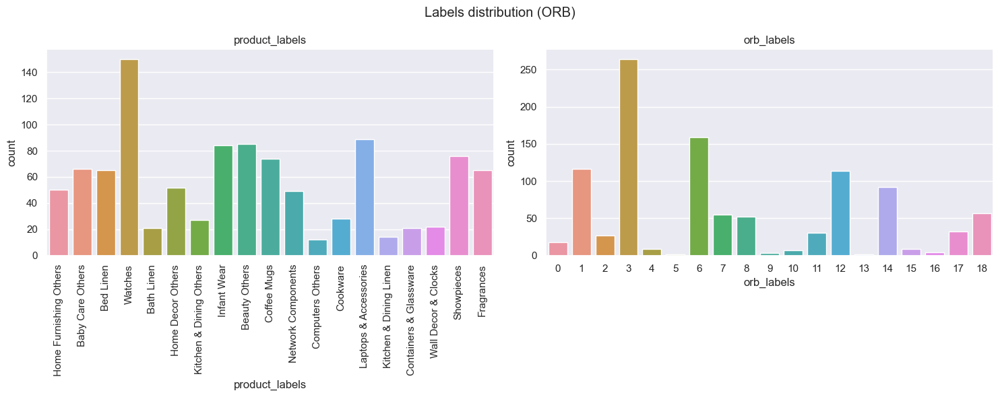

In [97]:
# Display projection
display_multihue_scatterplot(data=orb_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'orb_labels'],
                             title="t-SNE visualizations (ORB)")

# Display countplots
display_multi_countplot(data=orb_tsne, columns=['product_labels', 'orb_labels'], figsize=(15, 6),
                        title="Labels distribution (ORB)", xrotation=90)

## CNN : ResNet50

In [98]:
# Define ImageNet mean and standard deviation and image size
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]
IMAGE_SIZE = 224

I load the TEST images with pytorch and create training and testing sets.

In [99]:
# Data transformation (augmentation pipeline)
data_transforms = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=MEAN, std=STD)])

# Images datasets
image_datasets = datasets.ImageFolder(
         os.path.join(work_path + project_path + "/Flipkart/Images/TEST/"),
         transform=data_transforms)

# Dataloaders
dataloaders = DataLoader(image_datasets, batch_size=32, shuffle=False, num_workers=4)

# Device
torch_device = torch.device("cpu")

dataset_sizes = len(image_datasets)
print("Images dataset size :", dataset_sizes)

Images dataset size : 315


I load my finetuned CNN (**ResNet50**) model (see "projet6_cnn_tuning.ipnyb").

In [100]:
# Unverified context to avoid ssl failed
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

# Load the resnet model
cnn_model = resnet50(weights="ResNet50_Weights.DEFAULT")
n_features = cnn_model.fc.in_features
cnn_model.fc = torch.nn.Linear(n_features, n_labels)

# Load the fintuned resnet model
cnn_model.load_state_dict(torch.load("cnn_save/cnn_model.pth"))

<All keys matched successfully>

I predict some values.

In [101]:
# Function to predict a image classe
def cnn_predict_image(model, test_image_name, show=True):

    test_image = Image.open(work_path + project_path + "/Flipkart/Images/" + test_image_name)
    test_image_tensor = data_transforms(test_image)
    test_image_tensor = test_image_tensor.view(1, 3, IMAGE_SIZE, IMAGE_SIZE)

    with torch.no_grad():
        model.eval()
        # Model outputs log probabilities
        out = model(test_image_tensor)
        ps = torch.exp(out)

        if show is True:
            topk, topclass = ps.topk(1, dim=1)
            print("Output class :  ", classes[topclass.cpu().numpy()[0][0]])
            plt.axis("off")
            plt.imshow(test_image)
            plt.show()

        return ps

Output class :   Coffee Mugs


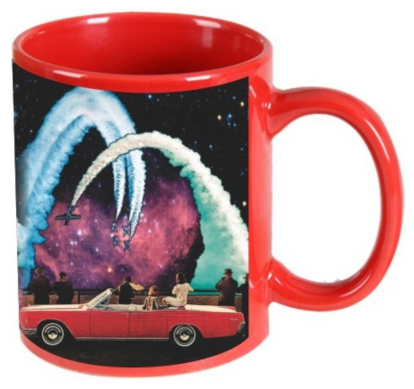

tensor([[1.2950, 0.3692, 3.6506, 1.7429, 4.4972, 0.2249, 0.4012, 0.8628, 1.7695,
         1.9026, 0.6984, 1.2236, 0.2059, 0.5247, 1.6197, 0.5058, 3.6741, 0.3704,
         2.5287]])

In [102]:
# Example of prediction
cnn_predict_image(cnn_model, images[150])

I predict the images in the dataframe order.

In [103]:
cnn_labels = []

# Loop over images
for image in test_images:
    ps = cnn_predict_image(cnn_model, image, show=False)
    topk, topclass = ps.topk(1, dim=1)
    image_classe = classes[topclass.cpu().numpy()[0][0]]
    cnn_labels.append(image_classe)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/PIL/Image.py:3074: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


I predict the images and vectors with the dataloaders (folder order).

In [104]:
# Set model to eval mode for predictions
cnn_model.eval()

cnn_images = []
cnn_inputs_labels = []
cnn_outputs = []
cnn_probs = []

with torch.no_grad():

    for (x, y) in dataloaders:

        x = x.to(torch_device)
        y_pred = cnn_model(x)
        y_prob = F.softmax(y_pred, dim=-1)

        cnn_images.append(x.cpu())
        cnn_inputs_labels.append(y.cpu())
        cnn_outputs.append(y_pred.cpu())
        cnn_probs.append(y_prob.cpu())

cnn_images = torch.cat(cnn_images, dim=0)
cnn_inputs_labels = torch.cat(cnn_inputs_labels, dim=0)
cnn_outputs = torch.cat(cnn_outputs, dim=0)
cnn_probs = torch.cat(cnn_probs, dim=0)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/PIL/Image.py:3074: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [105]:
# Get classes names
cnn_inputs_labels = [classes[label] for label in cnn_inputs_labels]
cnn_predict = [classes[label] for label in torch.argmax(cnn_probs, 1)]

In [106]:
# t-SNE on 2 components
cnn_tsne = TSNE_create(cnn_outputs, n_components=2, perplexity=30)

# Add category labels
cnn_tsne['product_labels'] = cnn_inputs_labels
cnn_tsne['cnn_labels'] = cnn_predict
res_sup_df['cnn_labels'] = cnn_labels
display(cnn_tsne.head(5))

,tSNE1,tSNE2,product_labels,cnn_labels
0,-8.445173,-6.728133,Baby Care Others,Infant Wear
1,-13.333278,-8.576464,Baby Care Others,Infant Wear
2,-13.470386,-10.178147,Baby Care Others,Infant Wear
3,-9.893529,-1.166801,Baby Care Others,Laptops & Accessories
4,-12.337749,-1.238653,Baby Care Others,Bed Linen


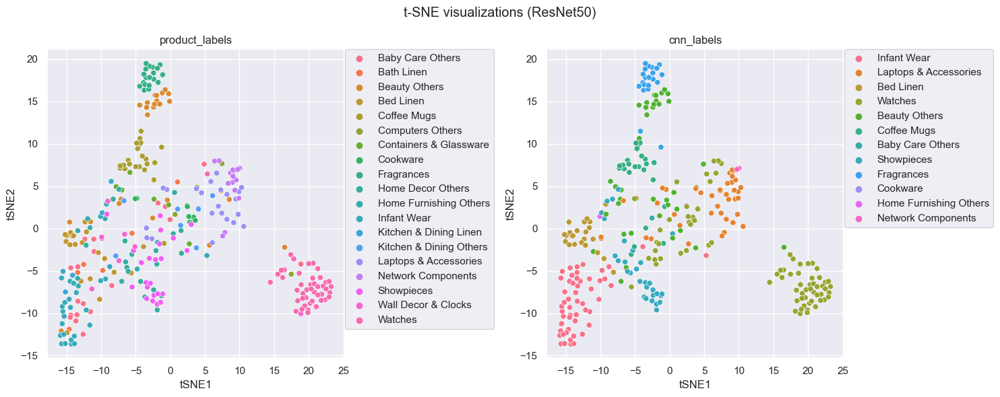

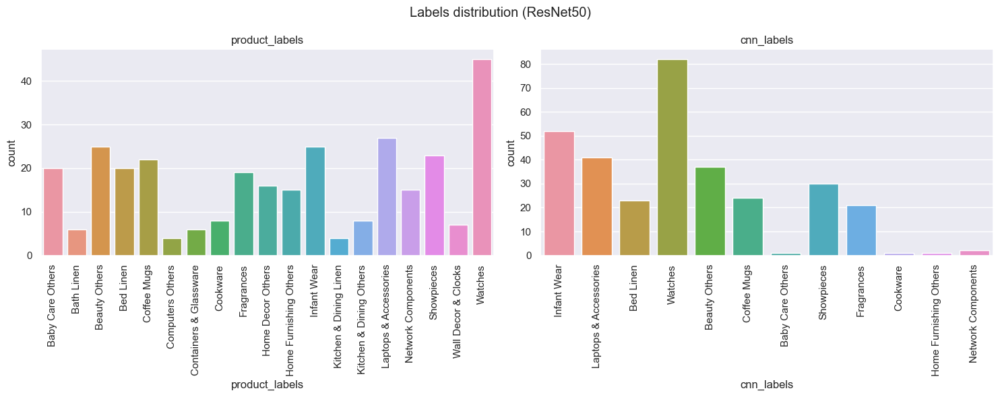

In [107]:
# Display projection
display_multihue_scatterplot(data=cnn_tsne, x='tSNE1', y='tSNE2', figsize=(15, 6),
                             hue_list=['product_labels', 'cnn_labels'],
                             title="t-SNE visualizations (ResNet50)")

# Display countplots
display_multi_countplot(data=cnn_tsne, columns=['product_labels', 'cnn_labels'], figsize=(15, 6),
                        title="Labels distribution (ResNet50)", xrotation=90)

I compute the precision of the first three prediction for each image.

In [108]:
cnn_top_pred = []
cnn_top_n = 3

# Loop over images
for i, image in enumerate(test_images):
    # Init prediction
    pred = False

    # Compute prediction
    ps = cnn_predict_image(cnn_model, image, show=False)
    top, topclass = ps.topk(cnn_top_n, dim=1)
    image_classes = [classes[top] for top in topclass.cpu().numpy()[0]]

    # Check result
    if test_labels[i] in image_classes:
        pred = True

    # Add result
    cnn_top_pred.append(pred)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/PIL/Image.py:3074: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


I compute the accuracy of the top three predictions

In [109]:
cnn_top_accuracy = sum(cnn_top_pred) / len(cnn_top_pred)

print("The precision of the ResNet50 model with the top three predictions is {:.2f} %".format(cnn_top_accuracy*100))

The precision of the ResNet50 model with the top three predictions is 73.33 %


# Comparison

In [110]:
# Display labels
display(res_df.head())
display(res_sup_df.head())

,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
0,Home Furnishing Others,0,11,9,14,6
1,Baby Care Others,0,1,6,14,6
2,Baby Care Others,0,1,6,18,11
3,Bed Linen,18,17,2,14,6
4,Bed Linen,18,17,2,14,3


,labels,labels_ft,labels_bert,use_labels,cnn_labels
27,Watches,Watches,Watches,Watches,Watches
116,Home Decor Others,Home Decor Others,Showpieces,Showpieces,Showpieces
410,Network Components,Network Components,Laptops & Accessories,Network Components,Network Components
859,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories
834,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories


I compute different scores of each clustering made with the different text and image methods.

In [111]:
# Initialize scores
ari_scores = []

for col in res_df.iloc[:, 1:].columns:
    # Get labels
    labels_pred = res_df[col].values
    labels_true = labels

    # Compute metrics
    ari_scores.append(adjusted_rand_score(labels_true, labels_pred))

# Create scores dataframe
scores_df = pd.DataFrame({
    'ARI score': ari_scores,
    },
    index=['Unigrams', 'Bigrams', 'TF-IDF', 'fastText', 'ORB'])

display(scores_df)

,ARI score
Unigrams,0.161692
Bigrams,0.074704
TF-IDF,0.429676
fastText,0.405779
ORB,0.036800


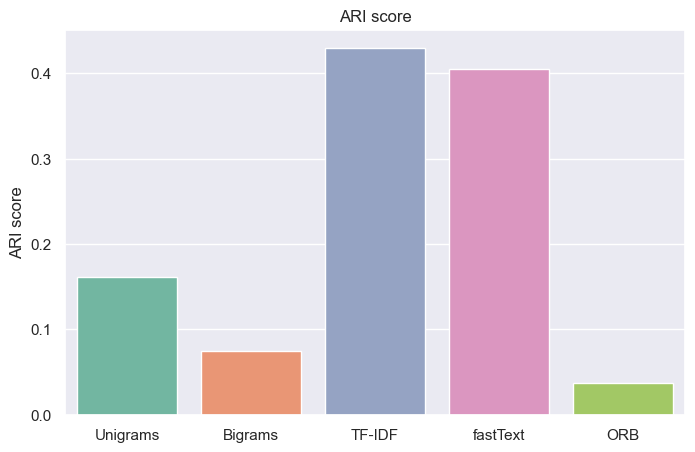

In [112]:
# Display scores
display_barplot(y=scores_df['ARI score'], x=scores_df.index,
                title="ARI score", figsize=(8, 5))

In [113]:
# Initialize scores
ari_sup_scores = []
f1_scores = []
acc_scores = []
rec_scores = []

for col in res_sup_df.iloc[:, 1:].columns:

    # Get labels
    labels_pred = res_sup_df[col].values
    labels_true = res_sup_df['labels'].values

    # Compute metrics
    ari_sup_scores.append(adjusted_rand_score(labels_true, labels_pred))
    f1_scores.append(f1_score(labels_true, labels_pred, average="macro"))
    acc_scores.append(accuracy_score(labels_true, labels_pred))
    rec_scores.append(recall_score(labels_true, labels_pred, average="macro"))

# Create scores dataframe
scores_sup_df = pd.DataFrame({
    'ARI score': ari_sup_scores,
    'F1 score': f1_scores,
    'Accuracy': acc_scores,
    'Recall': rec_scores
    },
    index=['fastText', 'BERT', 'USE', 'ResNet50'])

display(scores_sup_df)

,ARI score,F1 score,Accuracy,Recall
fastText,0.862087,0.834183,0.895238,0.842122
BERT,0.555337,0.413817,0.666667,0.463716
USE,0.803940,0.727369,0.834921,0.710613
ResNet50,0.392949,0.315236,0.558730,0.361638


I display the metrics.

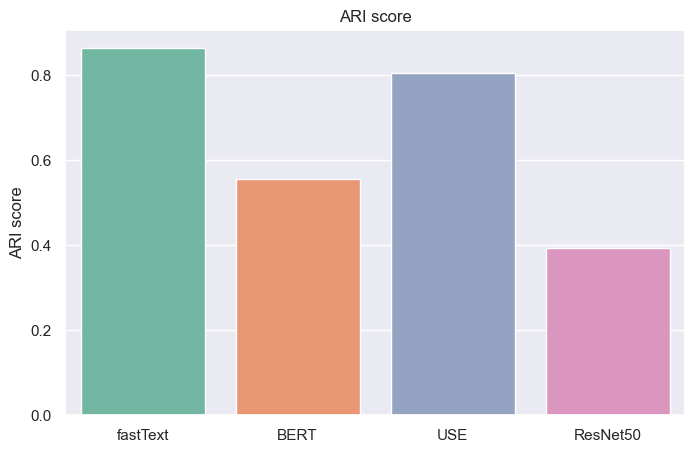

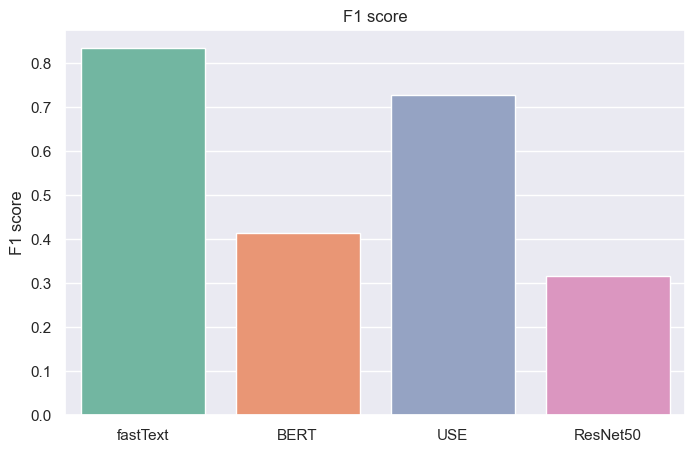

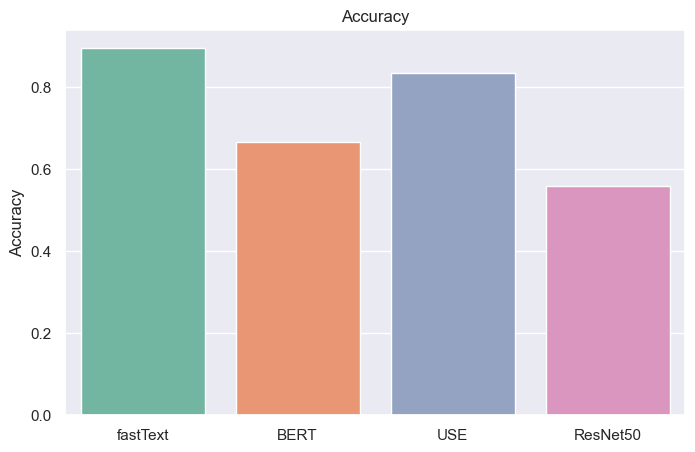

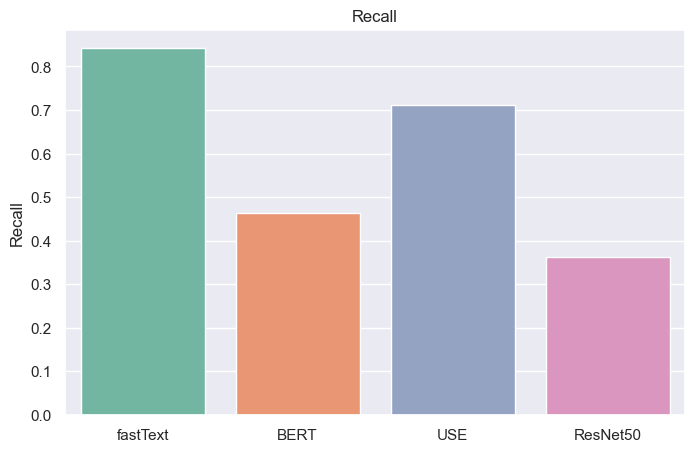

In [114]:
# Loop over columns
for col in scores_sup_df.columns:
    # Display scores
    display_barplot(y=scores_sup_df[col],
                    x=scores_sup_df.index,
                    title=col, figsize=(8, 5))

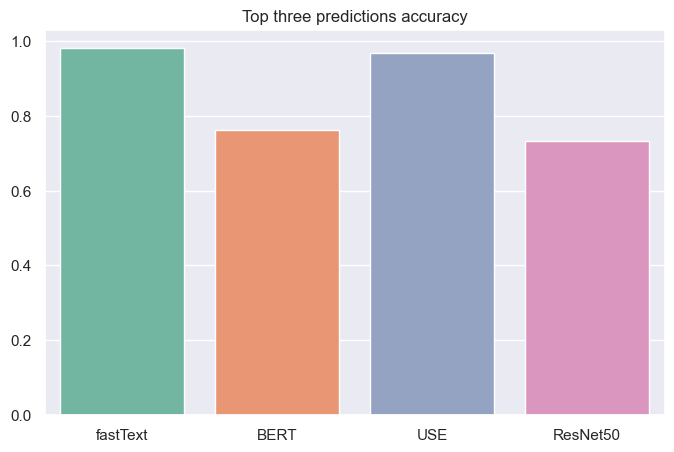

In [115]:
# Top three prediction accuracy
top_accuracy = [ft_top_accuracy, bert_top_accuracy, use_top_accuracy, cnn_top_accuracy]

# Display scores
display_barplot(y=top_accuracy, x=scores_sup_df.index,
                title="Top three predictions accuracy", figsize=(8, 5))

I sum the accuracy of the BERT and ResNet50 models.

In [116]:
# Compute BERT + ResNet50 accuracy (three first predictions)
text_image_top_pred = [i or j for i, j in zip(bert_top_pred, cnn_top_pred)]
text_image_top_accuracy = sum(text_image_top_pred) / len(text_image_top_pred)

print("The precision of the BERT + ResNet50 model with the top three predictions is {:.2f} %"
      .format(text_image_top_accuracy*100))

The precision of the BERT + ResNet50 model with the top three predictions is 79.37 %


## Best predictions for each class

I compute the best prediction model for each class.

In [117]:
obj_df = res_df.astype(str)

for label in classes:
    print(label + " :")
    display(obj_df[obj_df['labels'] == label].describe())   

Baby Care Others :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,66,66,66,66,66,66
unique,1,5,2,11,8,12
top,Baby Care Others,16,1,2,15,3
freq,66,34,63,20,18,27


Bath Linen :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,21,21,21,21,21,21
unique,1,2,1,3,4,10
top,Bath Linen,0,1,6,18,3
freq,21,12,21,19,11,7


Beauty Others :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,85,85,85,85,85,85
unique,1,4,3,5,10,10
top,Beauty Others,0,1,8,2,3
freq,85,43,81,45,25,35


Bed Linen :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,65,65,65,65,65,65
unique,1,3,2,5,5,10
top,Bed Linen,16,1,14,15,6
freq,65,48,63,23,48,22


Coffee Mugs :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,74,74,74,74,74,74
unique,1,6,4,2,5,10
top,Coffee Mugs,12,1,3,8,3
freq,74,21,30,53,23,19


Computers Others :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,12,12,12,12,12,12
unique,1,3,1,3,5,7
top,Computers Others,0,1,2,12,3
freq,12,6,12,9,6,4


Containers & Glassware :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,21,21,21,21,21,21
unique,1,3,2,3,5,8
top,Containers & Glassware,0,1,2,14,6
freq,21,16,16,13,7,6


Cookware :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,28,28,28,28,28,28
unique,1,2,1,2,4,10
top,Cookware,16,1,11,6,18
freq,28,21,28,19,17,8


Fragrances :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,65,65,65,65,65,65
unique,1,2,1,2,3,7
top,Fragrances,16,1,0,16,12
freq,65,62,65,62,62,22


Home Decor Others :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,52,52,52,52,52,52
unique,1,2,1,3,6,11
top,Home Decor Others,0,1,2,11,3
freq,52,27,52,28,21,11


Home Furnishing Others :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,50,50,50,50,50,50
unique,1,3,2,4,6,8
top,Home Furnishing Others,0,1,2,14,6
freq,50,34,40,24,31,18


Infant Wear :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,84,84,84,84,84,84
unique,1,3,2,3,4,11
top,Infant Wear,4,18,16,10,3
freq,84,73,72,50,76,20


Kitchen & Dining Linen :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,14,14,14,14,14,14
unique,1,2,1,2,2,7
top,Kitchen & Dining Linen,0,1,2,14,3
freq,14,10,14,10,10,4


Kitchen & Dining Others :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,27,27,27,27,27,27
unique,1,4,2,3,3,9
top,Kitchen & Dining Others,0,1,2,1,7
freq,27,15,26,11,12,6


Laptops & Accessories :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,89,89,89,89,89,89
unique,1,7,6,5,7,14
top,Laptops & Accessories,16,1,18,12,3
freq,89,44,63,36,40,14


Network Components :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,49,49,49,49,49,49
unique,1,2,1,2,3,13
top,Network Components,16,1,5,9,17
freq,49,48,49,48,46,12


Showpieces :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,76,76,76,76,76,76
unique,1,2,1,3,4,10
top,Showpieces,16,1,11,11,14
freq,76,50,76,49,48,20


Wall Decor & Clocks :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,22,22,22,22,22,22
unique,1,5,2,3,4,9
top,Wall Decor & Clocks,0,1,2,14,3
freq,22,10,20,13,12,8


Watches :


,labels,labels_unigrams,labels_bigrams,labels_tfidf,labels_ft_unsup,orb_labels
count,150,150,150,150,150,150
unique,1,2,3,3,5,11
top,Watches,15,0,4,17,3
freq,150,140,135,133,69,44


5:58: W291 trailing whitespace
INFO:pycodestyle:5:58: W291 trailing whitespace


In [118]:
obj_sup_df = res_sup_df.astype(str)

for label in classes:
    print(label + " :")
    display(obj_sup_df[obj_sup_df['labels'] == label].describe())

Baby Care Others :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,20,20,20,20,20
unique,1,5,6,7,6
top,Baby Care Others,Baby Care Others,Beauty Others,Baby Care Others,Infant Wear
freq,20,12,8,11,11


Bath Linen :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,6,6,6,6,6
unique,1,2,2,3,3
top,Bath Linen,Bath Linen,Beauty Others,Bath Linen,Infant Wear
freq,6,4,4,3,4


Beauty Others :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,25,25,25,25,25
unique,1,5,6,5,6
top,Beauty Others,Beauty Others,Beauty Others,Beauty Others,Beauty Others
freq,25,19,18,20,18


Bed Linen :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,20,20,20,20,20
unique,1,2,2,1,3
top,Bed Linen,Bed Linen,Bed Linen,Bed Linen,Bed Linen
freq,20,19,19,20,14


Coffee Mugs :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,22,22,22,22,22
unique,1,1,2,1,3
top,Coffee Mugs,Coffee Mugs,Coffee Mugs,Coffee Mugs,Coffee Mugs
freq,22,22,20,22,19


Computers Others :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,4,4,4,4,4
unique,1,3,1,1,2
top,Computers Others,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories,Watches
freq,4,2,4,4,3


Containers & Glassware :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,6,6,6,6,6
unique,1,3,3,4,3
top,Containers & Glassware,Containers & Glassware,Beauty Others,Kitchen & Dining Others,Beauty Others
freq,6,4,4,2,4


Cookware :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,8,8,8,8,8
unique,1,1,2,4,2
top,Cookware,Cookware,Cookware,Cookware,Watches
freq,8,8,5,5,7


Fragrances :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,19,19,19,19,19
unique,1,1,1,1,1
top,Fragrances,Fragrances,Fragrances,Fragrances,Fragrances
freq,19,19,19,19,19


Home Decor Others :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,16,16,16,16,16
unique,1,3,4,2,4
top,Home Decor Others,Home Decor Others,Showpieces,Showpieces,Showpieces
freq,16,9,10,10,10


Home Furnishing Others :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,15,15,15,15,15
unique,1,1,5,1,6
top,Home Furnishing Others,Home Furnishing Others,Infant Wear,Home Furnishing Others,Bed Linen
freq,15,15,8,15,5


Infant Wear :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,25,25,25,25,25
unique,1,1,1,1,1
top,Infant Wear,Infant Wear,Infant Wear,Infant Wear,Infant Wear
freq,25,25,25,25,25


Kitchen & Dining Linen :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,4,4,4,4,4
unique,1,1,2,2,3
top,Kitchen & Dining Linen,Kitchen & Dining Linen,Infant Wear,Home Furnishing Others,Infant Wear
freq,4,4,3,2,2


Kitchen & Dining Others :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,8,8,8,8,8
unique,1,2,3,3,4
top,Kitchen & Dining Others,Kitchen & Dining Others,Laptops & Accessories,Kitchen & Dining Others,Laptops & Accessories
freq,8,7,4,6,3


Laptops & Accessories :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,27,27,27,27,27
unique,1,2,1,1,3
top,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories,Laptops & Accessories
freq,27,26,27,27,20


Network Components :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,15,15,15,15,15
unique,1,1,3,1,3
top,Network Components,Network Components,Network Components,Network Components,Laptops & Accessories
freq,15,15,9,15,11


Showpieces :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,23,23,23,23,23
unique,1,2,2,3,3
top,Showpieces,Showpieces,Showpieces,Showpieces,Showpieces
freq,23,22,22,18,12


Wall Decor & Clocks :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,7,7,7,7,7
unique,1,1,2,3,6
top,Wall Decor & Clocks,Wall Decor & Clocks,Laptops & Accessories,Home Decor Others,Showpieces
freq,7,7,6,3,2


Watches :


,labels,labels_ft,labels_bert,use_labels,cnn_labels
count,45,45,45,45,45
unique,1,1,1,1,1
top,Watches,Watches,Watches,Watches,Watches
freq,45,45,45,45,45
